In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

# Load - Data

In [ ]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib
import matplotlib.pyplot as plt

# suppress warning
import warnings
warnings.filterwarnings('ignore')

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import scipy
from sklearn.metrics import r2_score
from statsmodels.graphics.tsaplots import plot_acf

#from IPython.display import Image

import seaborn as sns
sns.set()

%matplotlib inline

In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/gdf_final.csv')
df = pd.read_csv('gdf_final.csv')

df.head()

,event_type,end_station_name,trip_date,trip_hour,usage_counts,delta_time,dist,avgtemp,population_16_years_and_over_with_earnings,median_earnings_(dollars),total_population,median_age_(years),white,black_or_african_american,american_indian_and_alaska_native,asian
0,Athletic,Pier 40 - Hudson River Park,2021-10-17,9,10,23.000000,0.001563,66.92,22705,95310.0,30344,37.6,26983,423,0,1464
1,Athletic,Pier 40 - Hudson River Park,2021-10-17,10,13,22.000000,0.001563,66.92,22705,95310.0,30344,37.6,26983,423,0,1464
2,Athletic,Pier 40 - Hudson River Park,2021-10-17,11,28,21.000000,0.001563,66.92,22705,95310.0,30344,37.6,26983,423,0,1464
3,Athletic,Pier 40 - Hudson River Park,2021-10-17,12,24,20.041667,0.001563,66.92,22705,95310.0,30344,37.6,26983,423,0,1464
4,Athletic,Pier 40 - Hudson River Park,2021-10-17,13,34,19.000000,0.001563,66.92,22705,95310.0,30344,37.6,26983,423,0,1464


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119734 entries, 0 to 119733
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   event_type                                  119734 non-null  object 
 1   end_station_name                            119734 non-null  object 
 2   trip_date                                   119734 non-null  object 
 3   trip_hour                                   119734 non-null  int64  
 4   usage_counts                                119734 non-null  int64  
 5   delta_time                                  119734 non-null  float64
 6   dist                                        119734 non-null  float64
 7   avgtemp                                     119732 non-null  float64
 8   population_16_years_and_over_with_earnings  119734 non-null  int64  
 9   median_earnings_(dollars)                   119374 non-null  float64
 

In [ ]:
# df1 = pd.read_csv('/content/drive/MyDrive/gdf_tripdata.csv')
df1 = pd.read_csv('gdf_tripdata.csv')

df1.head()

,started_at,ended_at,start_station_name,start_lat,start_lng,end_station_name,end_lat,end_lng,event_name,start_date/time,...,asian,geometry,dist,Trip_Date,Trip_Hour,delta_time,date,avgTemp,usage_counts_x,usage_counts_y
0,2021-01-01 00:12:44.317000,2021-01-01 00:15:59.426000,Prospect Park West & 8 St,40.665147,-73.976376,Grand Army Plaza & Plaza St West,40.672968,-73.970880,"Christmas Tree Lighting, Nativity and Christma...",2021-01-01 20:00:00,...,3299.0,"(-73.9699011, 40.6730012)",0.000979,2021-01-01,0,19.0,2021-01-01,55.76,8714,8714
1,2021-01-01 00:44:38.354000,2021-01-01 00:48:46.098000,31 Ave & Crescent St,40.765835,-73.926547,31 St & Newtown Ave,40.767549,-73.920933,"Miracle Tree, Little Rockefeller at Athens Squ...",2021-01-01 09:00:00,...,4746.0,"(-73.9223319, 40.767786)",0.001418,2021-01-01,0,8.0,2021-01-01,55.76,1905,1905
2,2021-01-01 01:04:10.317000,2021-01-01 01:28:15.436000,Grand Concourse & E 164 St,40.829608,-73.921461,Grand Concourse & E 164 St,40.829608,-73.921461,Holiday Tree lighting,2021-01-01 17:00:00,...,656.0,"(-73.9224792, 40.8286949)",0.001368,2021-01-01,1,15.0,2021-01-01,55.76,286,286
3,2021-01-01 01:04:57.416000,2021-01-01 01:27:58.389000,Grand Concourse & E 164 St,40.829608,-73.921461,Grand Concourse & E 164 St,40.829608,-73.921461,Holiday Tree lighting,2021-01-01 17:00:00,...,656.0,"(-73.9224792, 40.8286949)",0.001368,2021-01-01,1,15.0,2021-01-01,55.76,286,286
4,2021-01-01 01:16:36.410000,2021-01-01 01:26:16.444000,21 St & 31 Dr,40.765900,-73.930819,31 St & Newtown Ave,40.767549,-73.920933,"Miracle Tree, Little Rockefeller at Athens Squ...",2021-01-01 09:00:00,...,4746.0,"(-73.9223319, 40.767786)",0.001418,2021-01-01,1,7.0,2021-01-01,55.76,1905,1905


In [ ]:
df1['start_date/time'] = pd.to_datetime(df1['start_date/time'])
df1['date'] = pd.to_datetime(df1['date'])
df1['hour'] = pd.to_datetime(df1['start_date/time']).dt.hour

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 782276 entries, 0 to 782275
Data columns (total 34 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   started_at                       782276 non-null  object        
 1   ended_at                         782276 non-null  object        
 2   start_station_name               782276 non-null  object        
 3   start_lat                        782276 non-null  float64       
 4   start_lng                        782276 non-null  float64       
 5   end_station_name                 782276 non-null  object        
 6   end_lat                          782276 non-null  float64       
 7   end_lng                          782276 non-null  float64       
 8   event_name                       782276 non-null  object        
 9   start_date/time                  782276 non-null  datetime64[ns]
 10  event_agency                     782276 non-

In [ ]:
# df1.event_type.unique()

In [ ]:
# df1.total_population.unique()

In [ ]:
# df1.black.unique()

In [ ]:
# df = pd.read_csv('/content/drive/MyDrive/gdf_final.csv')
df0 = pd.read_csv('All_trips_sum.csv')

df0.head()

,Trip_Date,Trip_Hour,end_station_name,trip_counts
0,2021-01-01,0,1 Ave & E 30 St,2
1,2021-01-01,0,1 Ave & E 5 St,1
2,2021-01-01,0,1 Ave & E 68 St,1
3,2021-01-01,0,1 Ave & E 78 St,4
4,2021-01-01,0,1 Ave & E 94 St,1


# Time - usage_count

### All

#### daily

In [ ]:
t_u = df0.groupby(['Trip_Date']).agg({'trip_counts':'sum'}).reset_index()
t_u['Trip_Date'] = pd.to_datetime(t_u['Trip_Date'])
t_u = t_u.rename(columns = {'Trip_Date':'trip_date','trip_counts':'usage_counts'})
t_u.head()

,trip_date,usage_counts
0,2021-01-01,18739
1,2021-01-02,41105
2,2021-01-03,14650
3,2021-01-04,36692
4,2021-01-05,38523


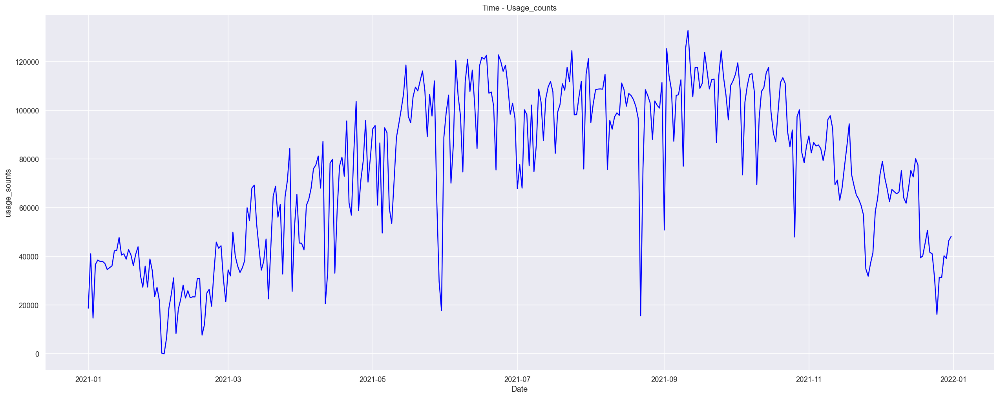

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_ai_line = plt.plot(t_u.trip_date,t_u.usage_counts, label = 'american_indian', color = 'blue')
plt.show()

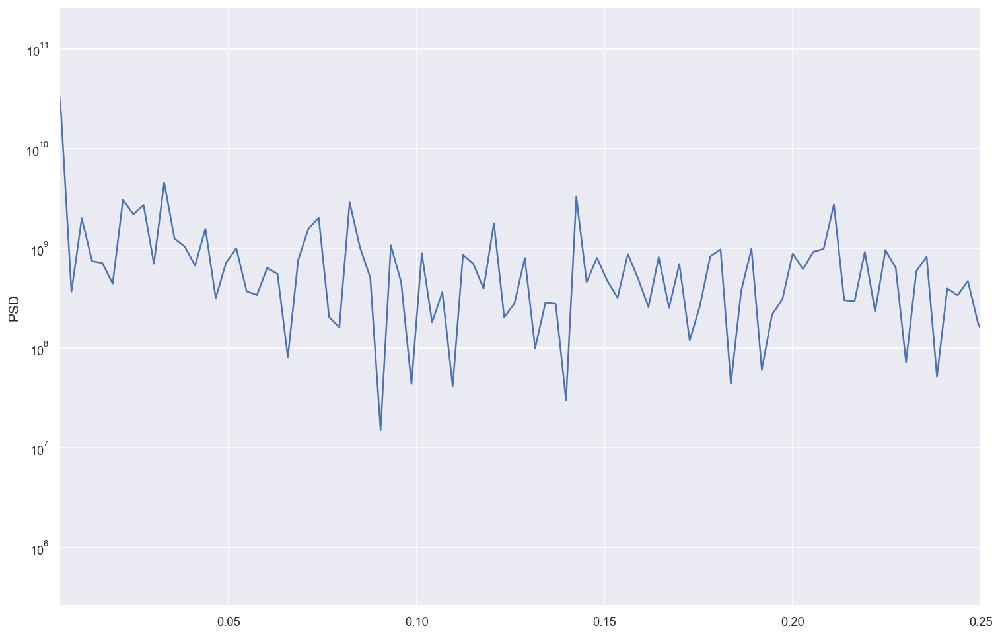

Strongest period length = 30.416666666666664


In [ ]:
f, PSD = scipy.signal.periodogram(t_u.usage_counts)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

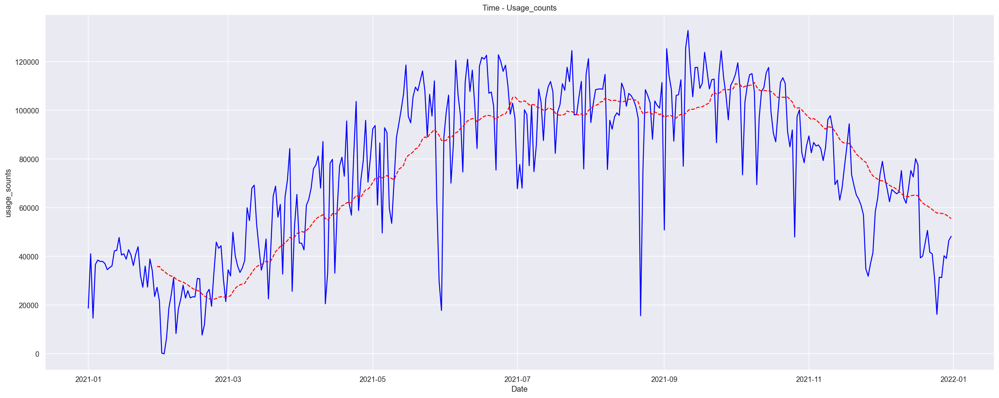

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_white_line = plt.plot(t_u.trip_date,t_u.usage_counts, label = 'white', color = 'blue')
FHV_mean_line = plt.plot(t_u.trip_date,t_u.usage_counts.rolling(window = 30).mean(), label='White Mean', linestyle='--',color='red')

#### Prediction(ARIMA(14,2,14)

In [ ]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
from statsmodels.tsa.stattools import adfuller

# suppress warning
import warnings
warnings.filterwarnings('ignore')

# suppress warning
import warnings
warnings.filterwarnings('ignore')
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
# from statsmodels.tsa import arima
from statsmodels.tsa.arima_model import ARIMA
# from statsmodels.tsa.stattools import acf, pacf,adfuller, kpss,range_unit_root_test # BDS for inped
from statsmodels.tsa.stattools import q_stat #Compute Ljung-Box Q Statistic.
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error, mean_squared_error
import scipy

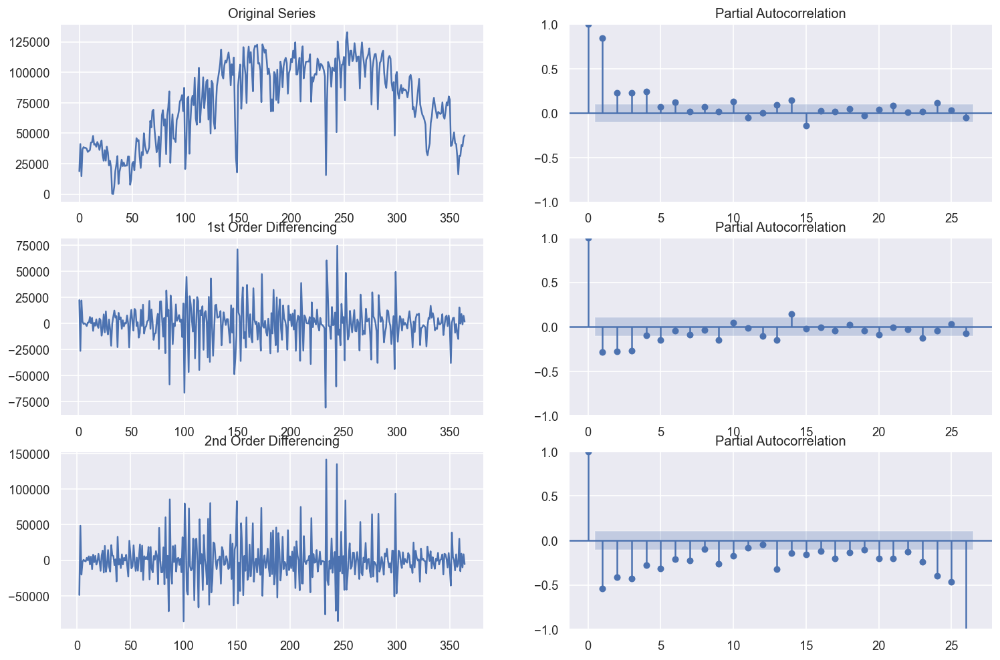

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= t_u.usage_counts

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
# raw
series= t_u.usage_counts#.diff()
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
series= t_u.usage_counts.diff()
result = adfuller(series.dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
series= t_u.usage_counts.diff().diff()
result = adfuller(series.dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -1.311245
  p-value: 0.624012

1st order differencing:
  ADF Statistic: -6.542335
  p-value: 0.000000

2nd order differencing:
  ADF Statistic: -9.393505
  p-value: 0.000000


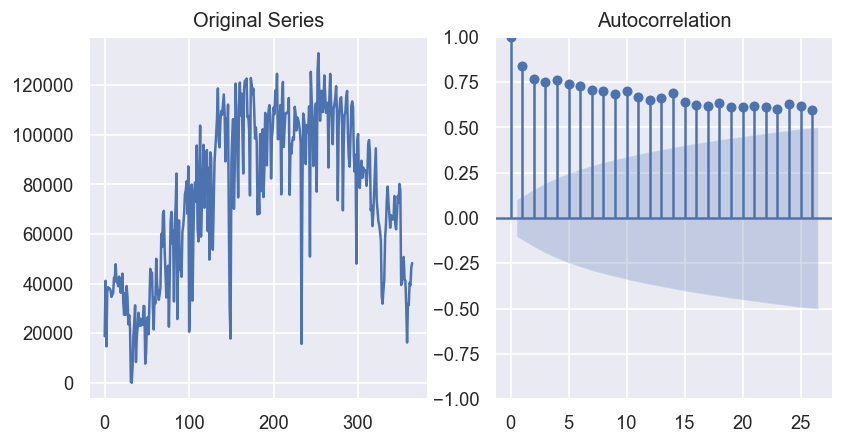

ADF Statistic: -1.311245
p-value: 0.624012
Critical Values:
	1%: -3.449
	5%: -2.870
	10%: -2.571


In [ ]:
fig, axes = plt.subplots(1, 2,figsize=(8,4))
axes[0].plot(t_u.usage_counts)
axes[0].set_title('Original Series')
plot_acf(t_u.usage_counts, ax=axes[1])
plt.show()

series=t_u.usage_counts
result = adfuller(series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

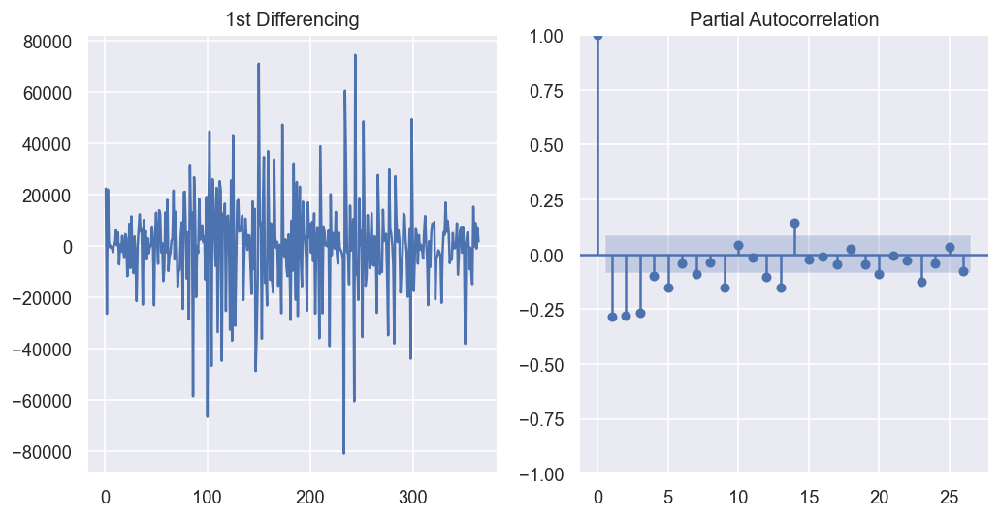

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_u.usage_counts.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(t_u.usage_counts.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

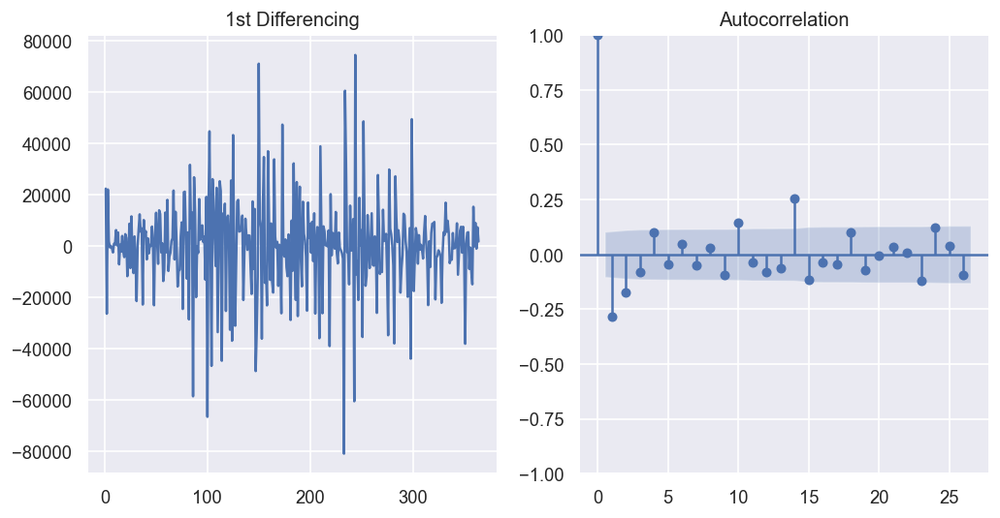

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_u.usage_counts.diff()); axes[0].set_title('1st Differencing')
plot_acf(t_u.usage_counts.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:           usage_counts   No. Observations:                  320
Model:               ARIMA(14, 2, 14)   Log Likelihood               -3520.734
Date:                Mon, 25 Apr 2022   AIC                           7099.467
Time:                        21:06:26   BIC                           7208.567
Sample:                             0   HQIC                          7143.042
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3556      2.105     -0.644      0.520      -5.482       2.771
ar.L2         -1.4925      2.990     -0.499      0.618      -7.353       4.368
ar.L3         -1.7345      3.130     -0.554      0.5

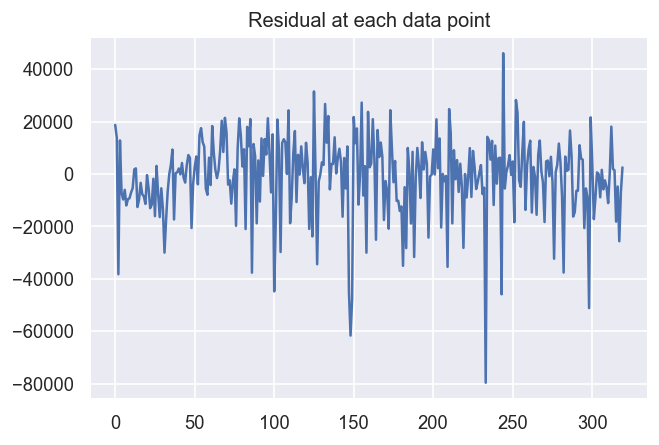

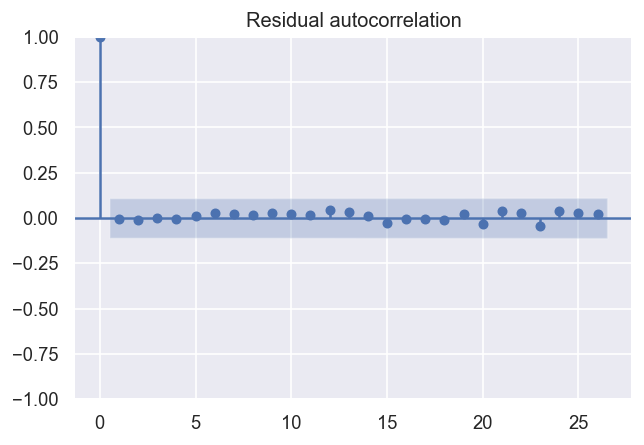

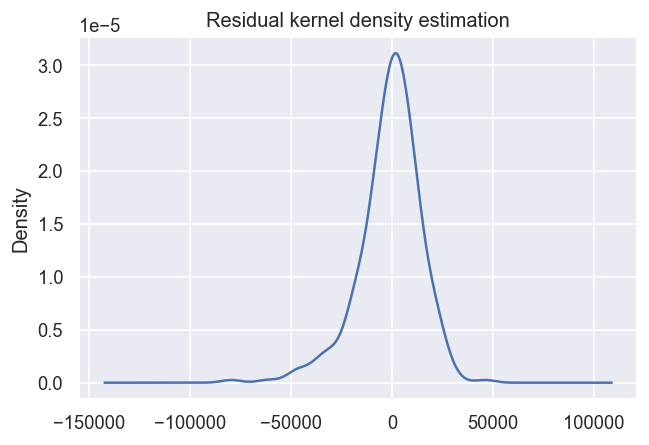

                  0
count    320.000000
mean   -1156.853625
std    15445.082264
min   -79662.248126
25%    -8296.210016
50%      515.396995
75%     8429.262974
max    46080.611778
p value is  4.626403881487423e-16
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
     lb_stat  lb_pvalue
1   0.018094   0.892997
2   0.061405   0.969764
3   0.062716   0.995900
4   0.076026   0.999296
5   0.108591   0.999801
6   0.339631   0.999281
7   0.519652   0.999371
8   0.632554   0.999676
9   0.889560   0.999653
10  1.091361   0.999743


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=14
D=2
Q=14

# fit model
N=320 
series = t_u.usage_counts#.values

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

In [ ]:
# !pip install statsmodels --upgrade

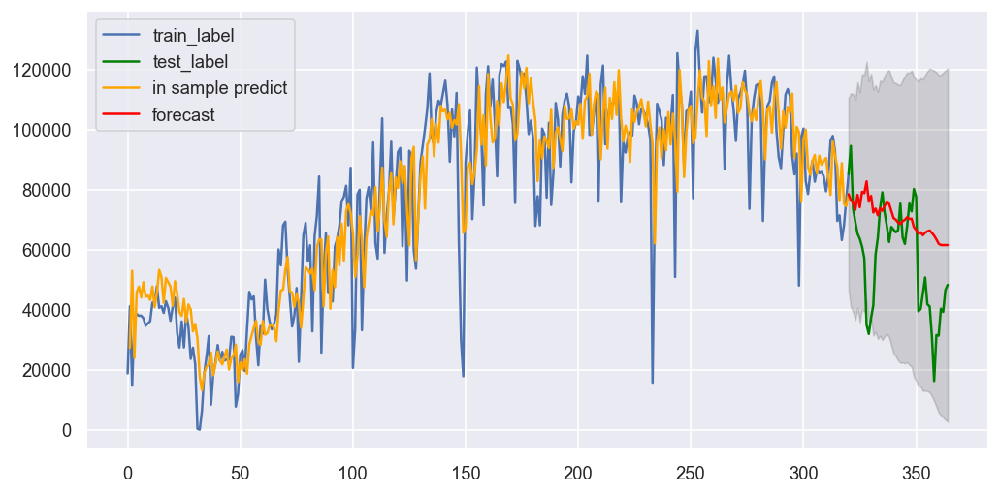

In [ ]:
# Forecast

fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(t_u.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(t_u.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(t_u.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(t_u.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

#### hourly

In [ ]:
t_u_h = df1.groupby(['date','hour']).agg({'usage_counts_x':'sum'}).reset_index()
t_u_h['date'] = pd.to_datetime(t_u_h['date'])
t_u_h.head()
# t_u_h = df0.groupby(['Trip_Date','Trip_Hour']).agg({'trip_counts':'sum'}).reset_index()
# t_u_h['Trip_Date'] = pd.to_datetime(t_u_h['Trip_Date'])
# t_u_h = t_u_h.rename(columns = {'Trip_Date':'date','trip_counts':'usage_counts_x'})
# t_u_h.head()

,date,hour,usage_counts_x
0,2021-01-01,0,329480
1,2021-01-01,6,304334
2,2021-01-01,7,1941471
3,2021-01-01,8,4231510
4,2021-01-01,9,55245


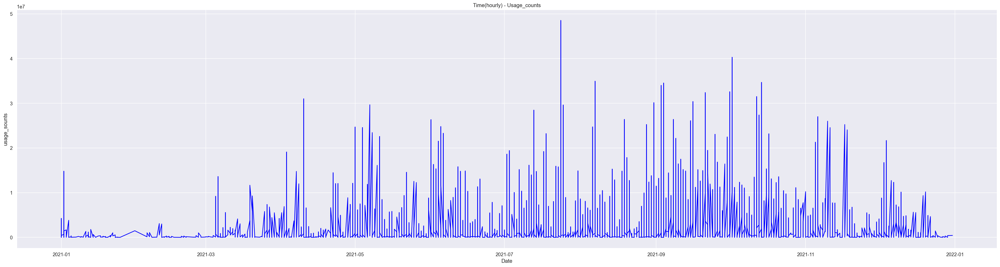

In [ ]:
plt.figure(figsize = (40,10))
plt.title('Time(hourly) - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_ai_line = plt.plot(t_u_h.date,t_u_h.usage_counts_x, label = 'usage_counts_x', color = 'blue')
plt.show()

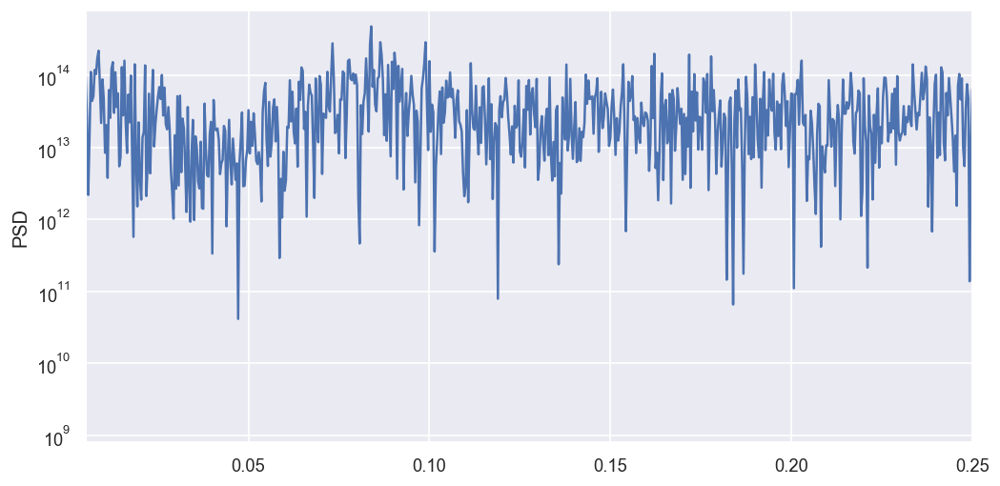

Strongest period length = 11.914893617021278


In [ ]:
f, PSD = scipy.signal.periodogram(t_u_h.usage_counts_x)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

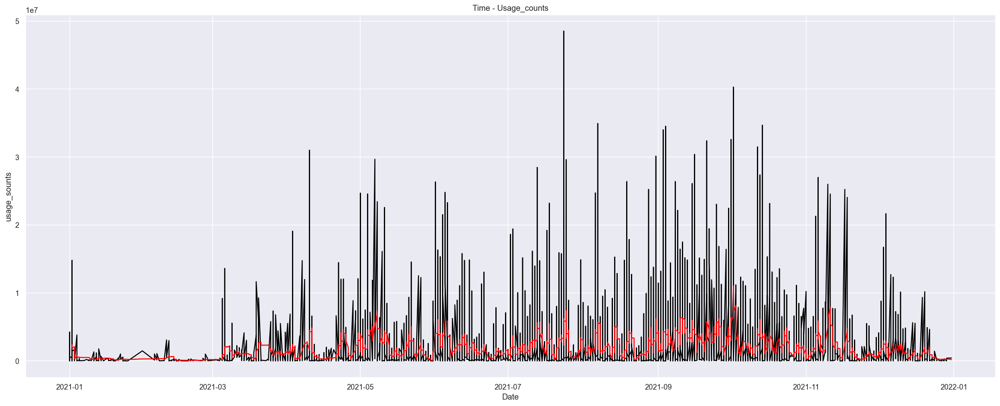

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_white_line = plt.plot(t_u_h.date,t_u_h.usage_counts_x, label = 'usage_counts_x', color = 'black')
FHV_mean_line = plt.plot(t_u_h.date,t_u_h.usage_counts_x.rolling(window = 12).mean(), label='White Mean', linestyle='-',color='red')

### Prediction ARIMA(1，0，1)

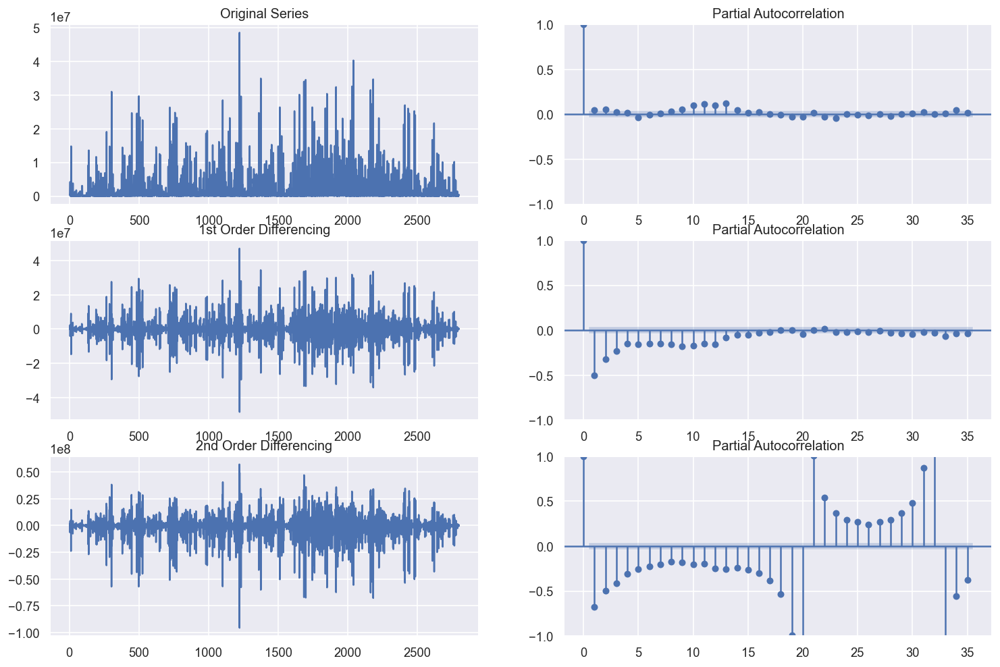

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= t_u_h.usage_counts_x

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
# raw
series= t_u_h.usage_counts_x#.diff()
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
series= t_u.usage_counts.diff()
result = adfuller(series.dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
series= t_u.usage_counts.diff().diff()
result = adfuller(series.dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -8.347635
  p-value: 0.000000

1st order differencing:
  ADF Statistic: -6.542335
  p-value: 0.000000

2nd order differencing:
  ADF Statistic: -9.393505
  p-value: 0.000000


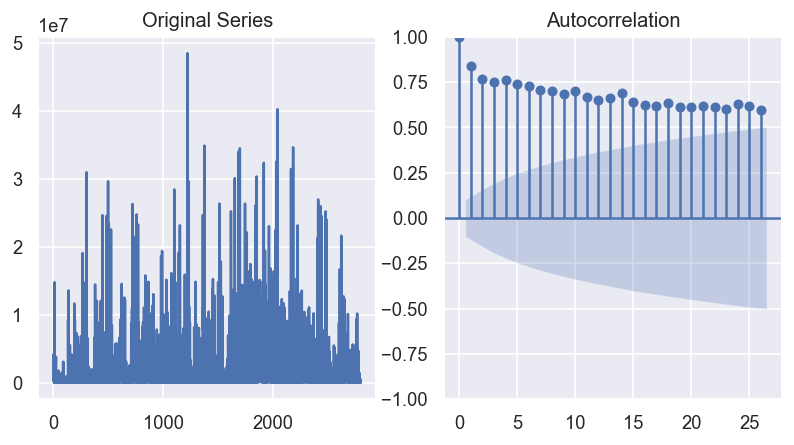

ADF Statistic: -8.347635
p-value: 0.000000
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


In [ ]:
fig, axes = plt.subplots(1, 2,figsize=(8,4))
axes[0].plot(t_u_h.usage_counts_x)
axes[0].set_title('Original Series')
plot_acf(t_u.usage_counts, ax=axes[1])
plt.show()

series=t_u_h.usage_counts_x
result = adfuller(series)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

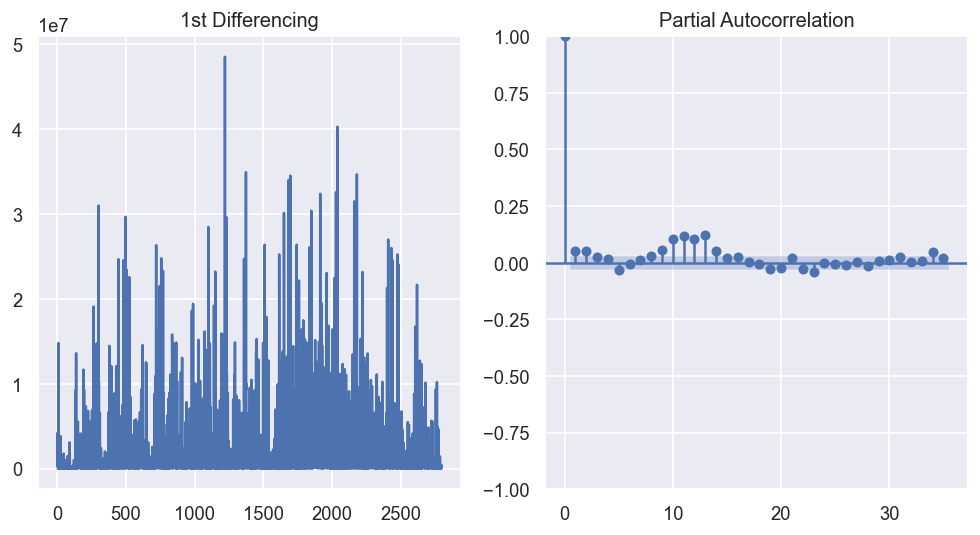

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_u_h.usage_counts_x)
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(t_u_h.usage_counts_x.dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

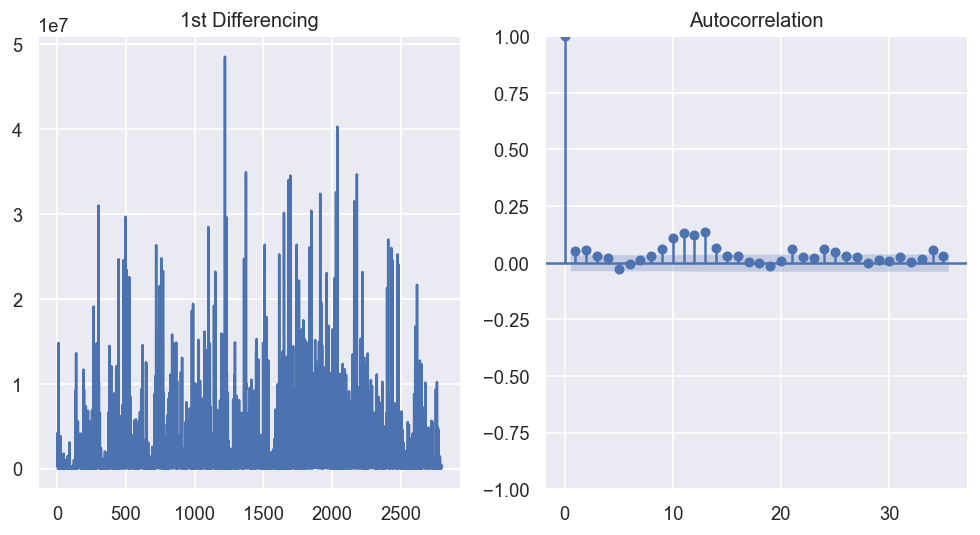

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_u_h.usage_counts_x); axes[0].set_title('1st Differencing')
plot_acf(t_u_h.usage_counts_x.dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:         usage_counts_x   No. Observations:                 2750
Model:                 ARIMA(1, 0, 1)   Log Likelihood              -46030.642
Date:                Mon, 25 Apr 2022   AIC                          92069.285
Time:                        21:29:18   BIC                          92092.962
Sample:                             0   HQIC                         92077.839
                               - 2750                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.217e+06   5.75e-11   3.85e+16      0.000    2.22e+06    2.22e+06
ar.L1          0.9863      0.007    138.835      0.000       0.972       1.000
ma.L1         -0.9623      0.012    -80.639      0.0

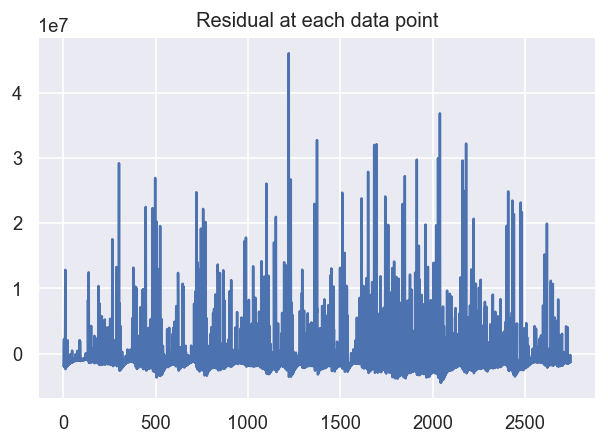

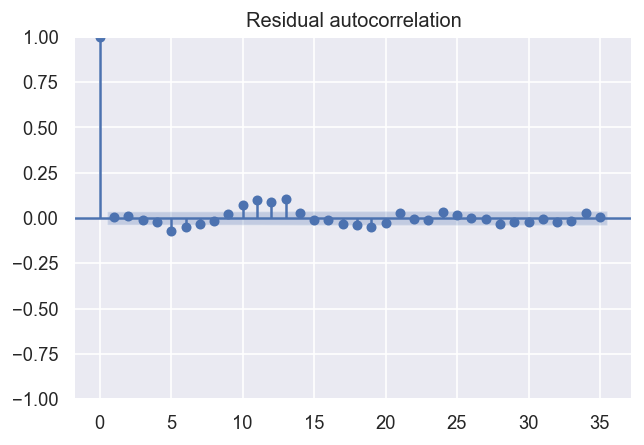

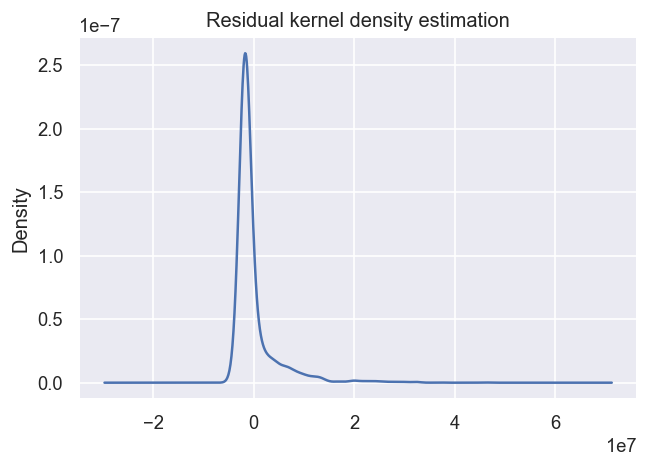

                  0
count  2.750000e+03
mean  -7.431253e+03
std    4.499893e+06
min   -4.464030e+06
25%   -2.044250e+06
50%   -1.419375e+06
75%   -2.858708e+05
max    4.602479e+07
p value is  0.0
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
      lb_stat  lb_pvalue
1    0.086713   0.768398
2    0.448880   0.798963
3    0.888352   0.828238
4    2.490023   0.646423
5   17.354333   0.003875
6   24.309057   0.000458
7   27.214625   0.000305
8   27.831548   0.000507
9   28.842679   0.000689
10  43.859806   0.000003


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=1
D=0
Q=1

# fit model
N=2750 
series = t_u_h.usage_counts_x#.values

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

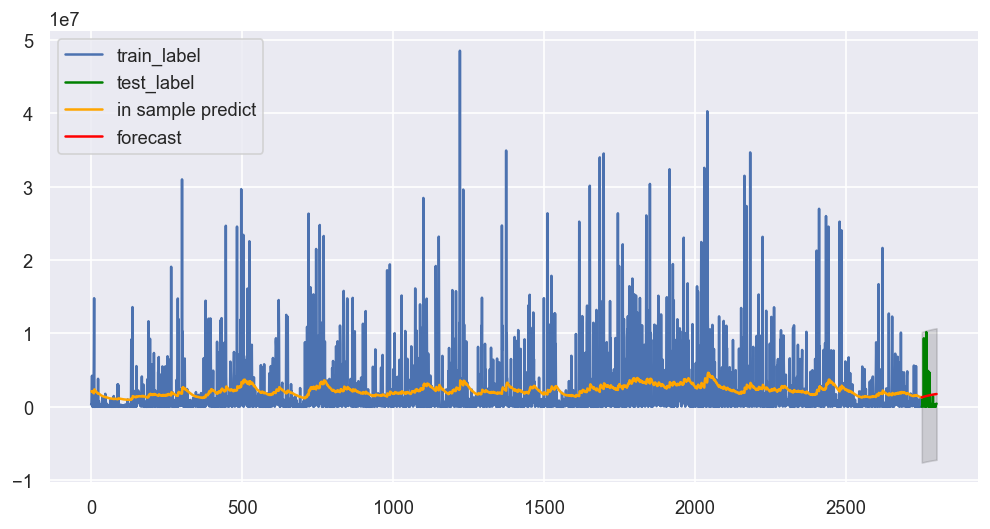

In [ ]:
# Forecast

fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(t_u_h.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(t_u_h.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(t_u_h.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(t_u_h.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

In [ ]:
len(t_u_h)

2800

# Time - avgTemp

In [ ]:
t_t = df.groupby(['trip_date']).agg({'avgtemp':'mean'}).reset_index()
t_t['trip_date'] = pd.to_datetime(t_t['trip_date'])
t_t.dropna().head()

,trip_date,avgtemp
0,2021-01-01,55.76
1,2021-01-02,53.96
2,2021-01-03,53.60
3,2021-01-04,53.78
4,2021-01-05,55.94


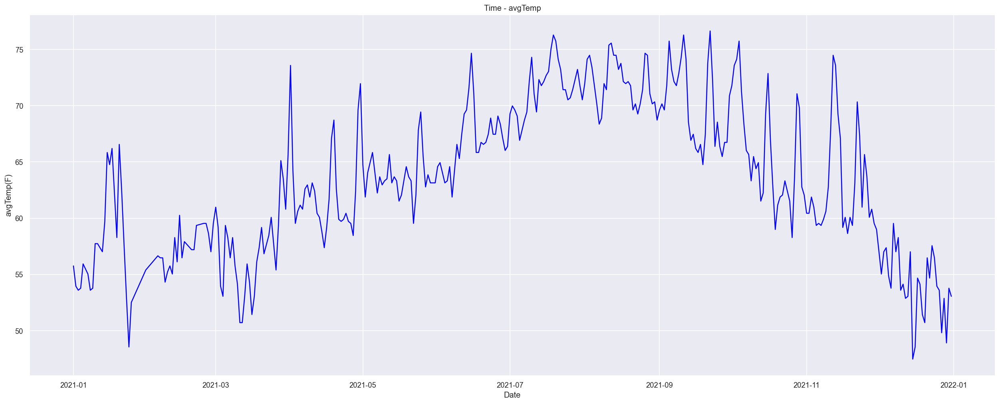

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time - avgTemp')
plt.xlabel('Date')
plt.ylabel('avgTemp(F)')
race_ai_line = plt.plot(t_t.trip_date,t_t.avgtemp, label = 'avgtemp', color = 'blue')
plt.show()

### 做不了天气的decompose，因为没有周期，psd全是nan值

### Prediction ARIMA(1，1，2)

In [ ]:
# raw
series= t_t.avgtemp#.diff()
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
series= t_t.avgtemp.diff()
result = adfuller(series.dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
series= t_t.avgtemp.diff().diff()
result = adfuller(series.dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -1.155398
  p-value: 0.692482

1st order differencing:
  ADF Statistic: -9.476159
  p-value: 0.000000

2nd order differencing:
  ADF Statistic: -9.646344
  p-value: 0.000000


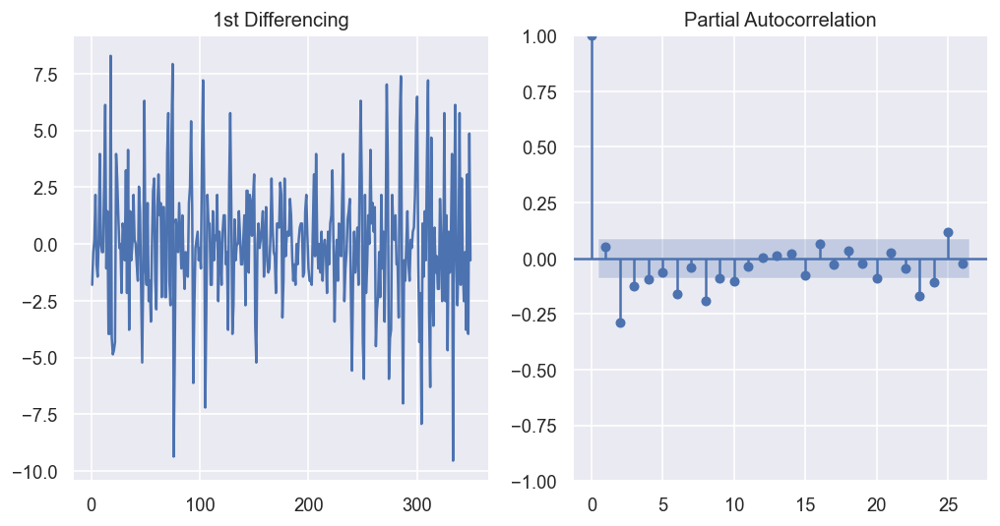

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_t.avgtemp.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(t_t.avgtemp.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

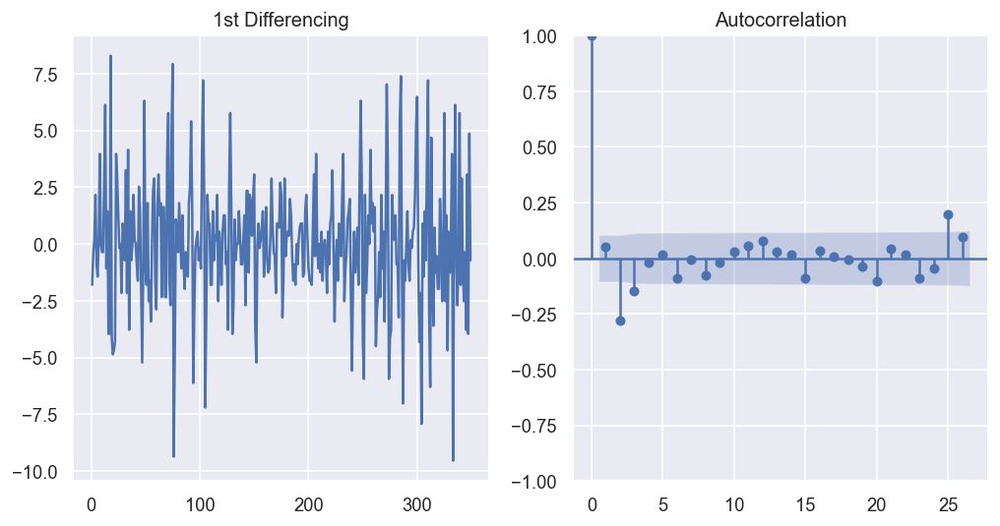

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(t_t.avgtemp.diff()); axes[0].set_title('1st Differencing')
plot_acf(t_t.avgtemp.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:                avgtemp   No. Observations:                  320
Model:                 ARIMA(2, 1, 1)   Log Likelihood                -734.818
Date:                Mon, 25 Apr 2022   AIC                           1477.635
Time:                        18:42:40   BIC                           1492.696
Sample:                             0   HQIC                          1483.650
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8835      0.049     17.966      0.000       0.787       0.980
ar.L2         -0.3311      0.049     -6.789      0.000      -0.427      -0.236
ma.L1         -0.8828      0.034    -26.024      0.0

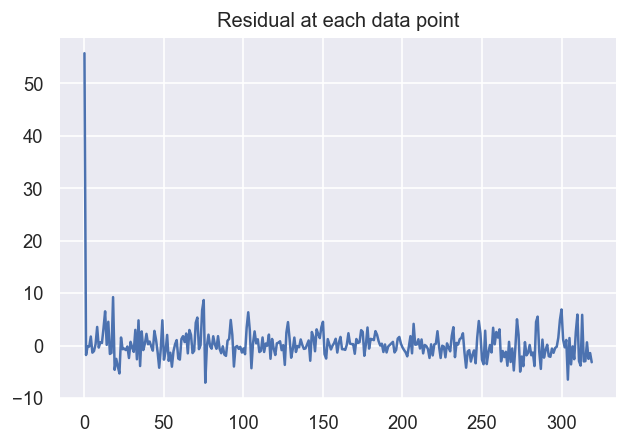

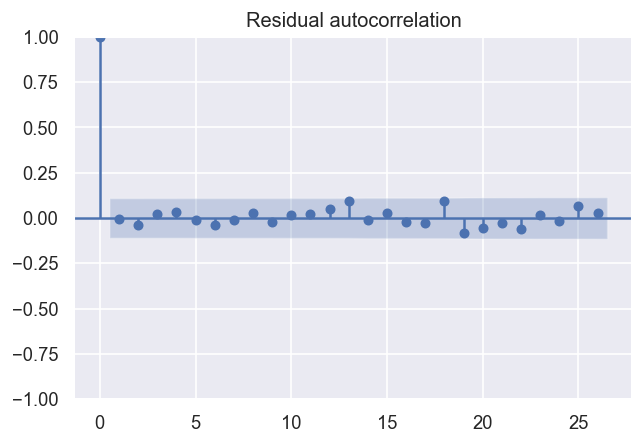

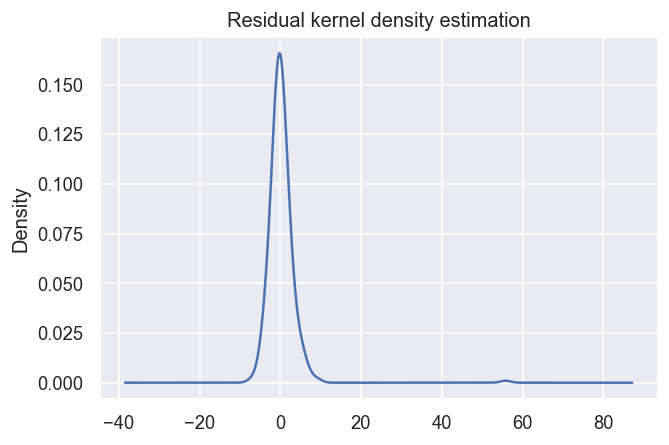

                0
count  320.000000
mean     0.241790
std      3.942675
min     -7.082519
25%     -1.341974
50%     -0.057743
75%      1.296720
max     55.760000
p value is  1.3572006621796015e-115
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
     lb_stat  lb_pvalue
1   0.015959   0.899472
2   0.494154   0.781080
3   0.632236   0.889015
4   1.032697   0.904798
5   1.060740   0.957519
6   1.572182   0.954556
7   1.602797   0.978536
8   1.831734   0.985743
9   2.000437   0.991461
10  2.063594   0.995829


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=1
D=1
Q=2

# fit model
N=320 
series = t_t.avgtemp#.values

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

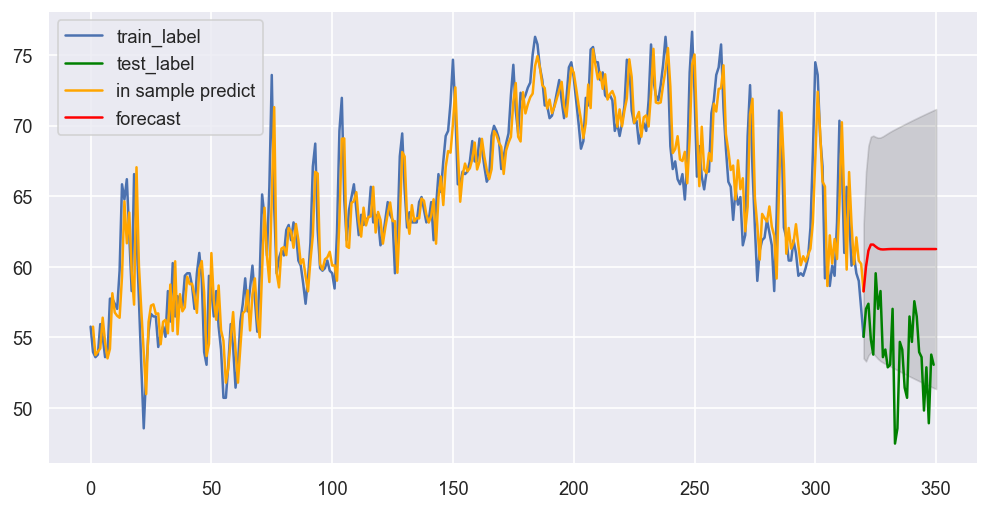

In [ ]:
# Forecast

fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(t_t.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(t_t.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(t_t.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(t_t.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

# avgTemp - usage_counts

## Daily 

### 这里用了每一天的usage_counts/temp

In [ ]:
a_u = df.groupby(['trip_date','avgtemp']).agg({'usage_counts':'sum'}).reset_index()
a_u['trip_date'] = pd.to_datetime(a_u['trip_date'])
a_u['avgt_usage'] = a_u['usage_counts']/a_u['avgtemp']
a_u.head()

,trip_date,avgtemp,usage_counts,avgt_usage
0,2021-01-01,55.76,744,13.342898
1,2021-01-02,53.96,1871,34.673832
2,2021-01-03,53.60,244,4.552239
3,2021-01-04,53.78,501,9.315731
4,2021-01-05,55.94,91,1.626743


In [ ]:
len(a_u)

350

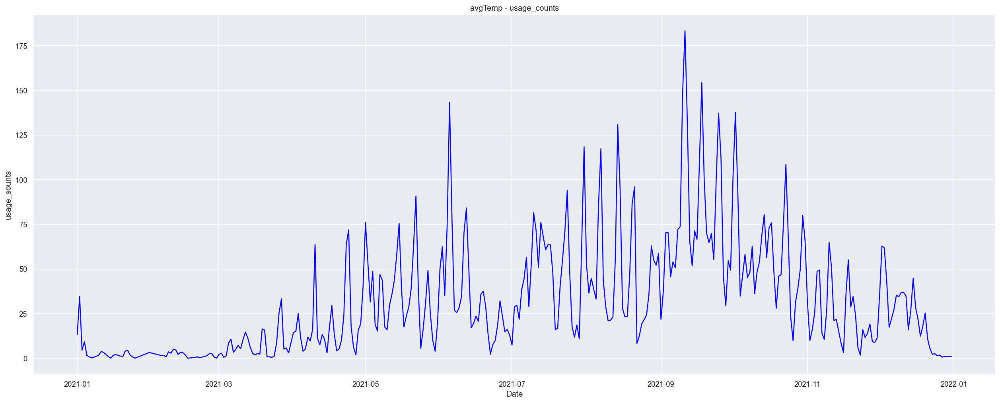

In [ ]:
plt.figure(figsize = (26,10))
plt.title('avgTemp - usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_ai_line = plt.plot(a_u.trip_date,a_u.avgt_usage, label = 'usage_counts', color = 'blue')
plt.show()

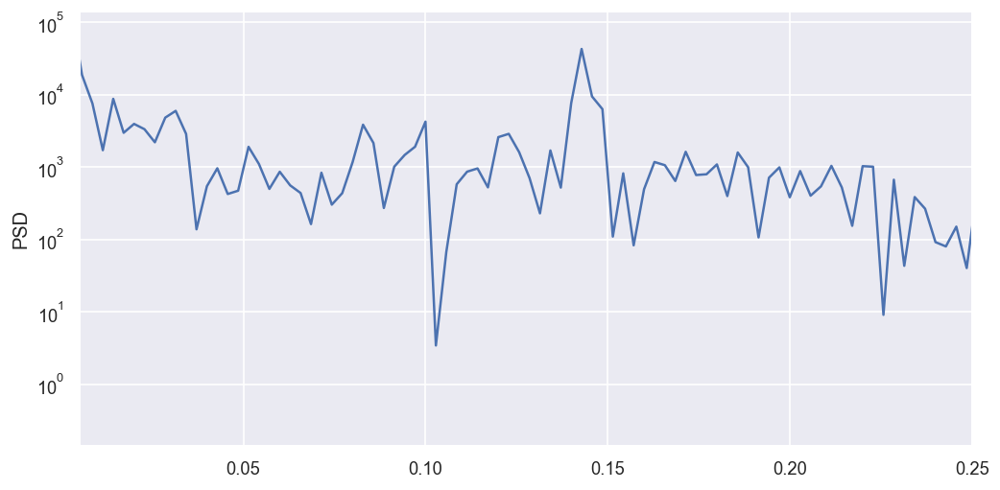

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(a_u.avgt_usage)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

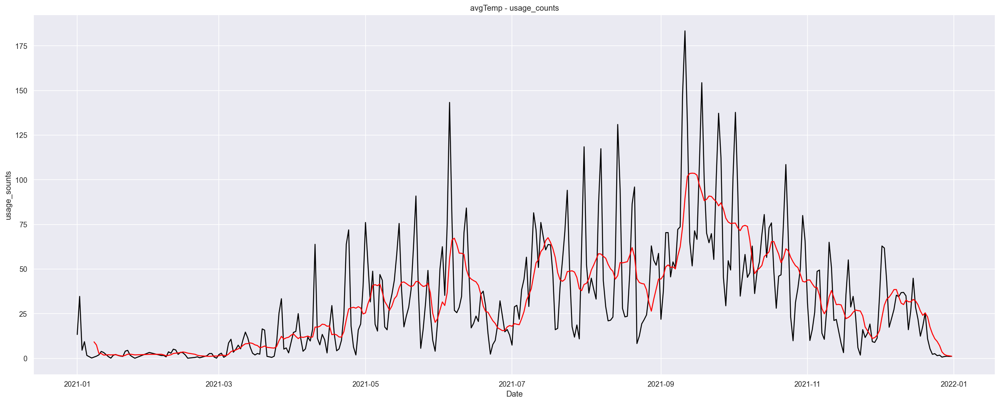

In [ ]:
plt.figure(figsize = (26,10))
plt.title('avgTemp - usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_white_line = plt.plot(a_u.trip_date,a_u.avgt_usage, label = 'white', color = 'black')
FHV_mean_line = plt.plot(a_u.trip_date,a_u.avgt_usage.rolling(window = 7).mean(), label='White Mean', linestyle='-',color='red')

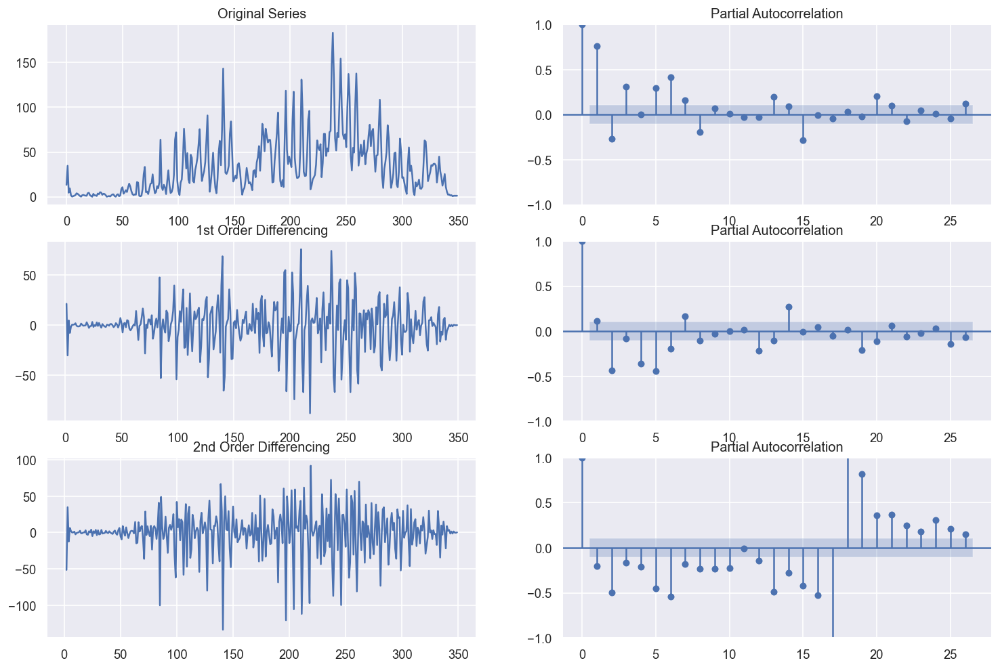

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= a_u.avgt_usage

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
series= a_u.avgt_usage

# raw
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
result = adfuller(series.diff().dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
result = adfuller(series.diff().diff().dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -2.097408
  p-value: 0.245558

1st order differencing:
  ADF Statistic: -5.625946
  p-value: 0.000001

2nd order differencing:
  ADF Statistic: -7.192882
  p-value: 0.000000


### DAILY-U/aT-ARIMA(2,1,14)

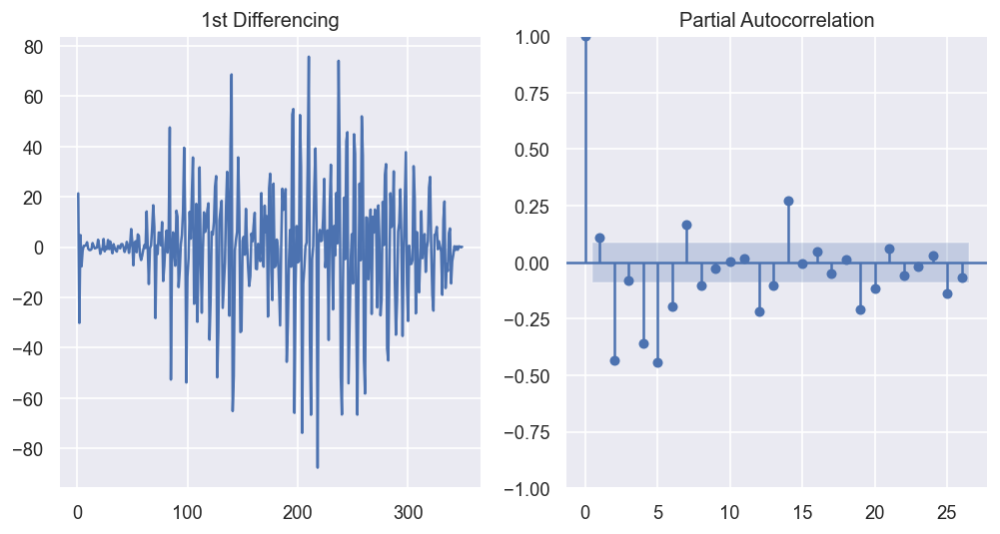

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(series.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

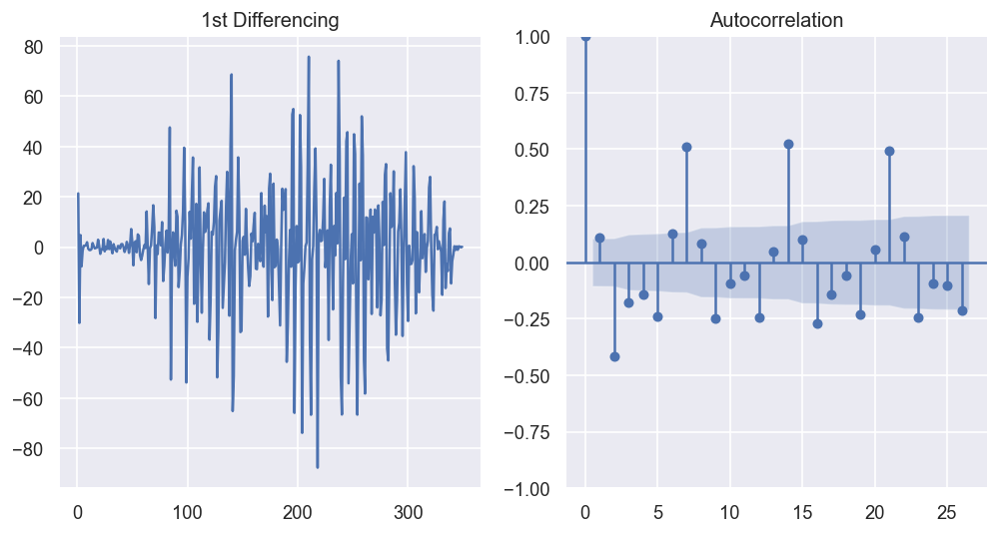

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff()); axes[0].set_title('1st Differencing')
plot_acf(series.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:             avgt_usage   No. Observations:                  320
Model:                ARIMA(14, 1, 2)   Log Likelihood               -1329.672
Date:                Mon, 25 Apr 2022   AIC                           2693.344
Time:                        21:39:55   BIC                           2757.352
Sample:                             0   HQIC                          2718.906
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1803      0.257     -0.703      0.482      -0.683       0.323
ar.L2         -0.3487      0.235     -1.485      0.137      -0.809       0.111
ar.L3         -0.3440      0.166     -2.076      0.0

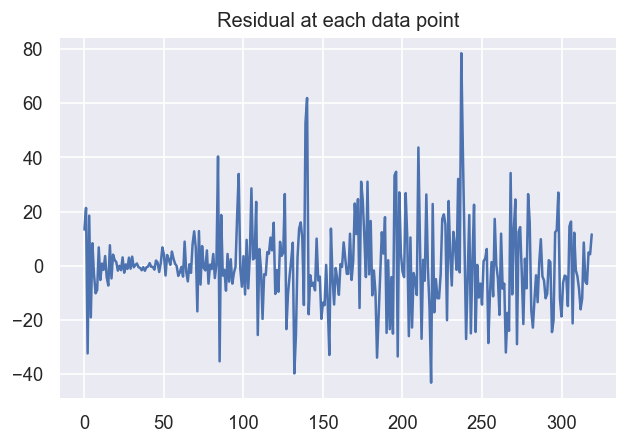

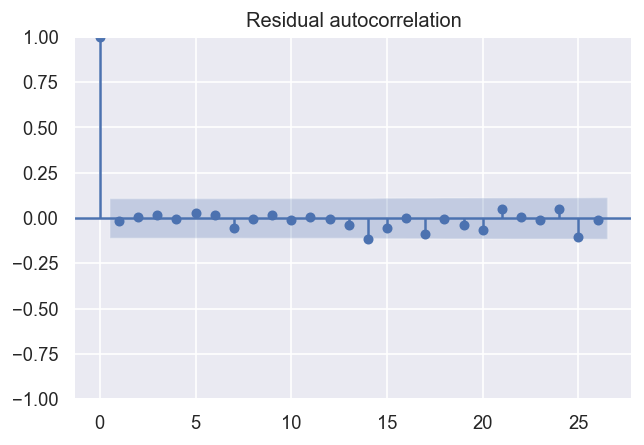

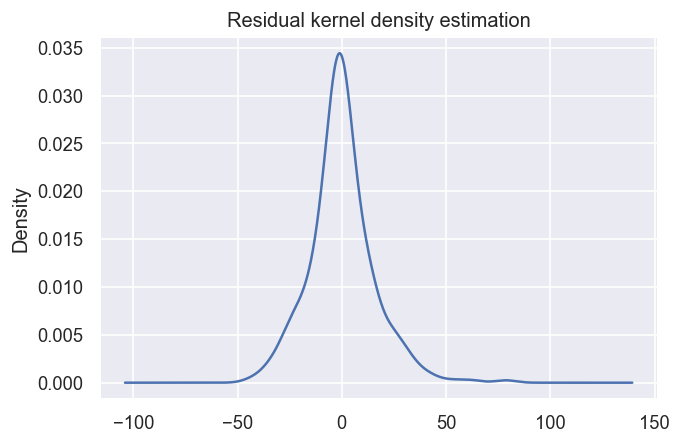

                0
count  320.000000
mean     0.116071
std     15.663616
min    -43.179713
25%     -7.350016
50%     -0.787284
75%      7.181633
max     78.442462
p value is  3.1760944804804257e-11
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
     lb_stat  lb_pvalue
1   0.086597   0.768548
2   0.097310   0.952509
3   0.205974   0.976619
4   0.216570   0.994544
5   0.444009   0.994030
6   0.532714   0.997417
7   1.565392   0.979959
8   1.576350   0.991366
9   1.676906   0.995609
10  1.711030   0.998114


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=2
D=1
Q=14

# fit model
N=320 
series= a_u.avgt_usage

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

#### Forecast

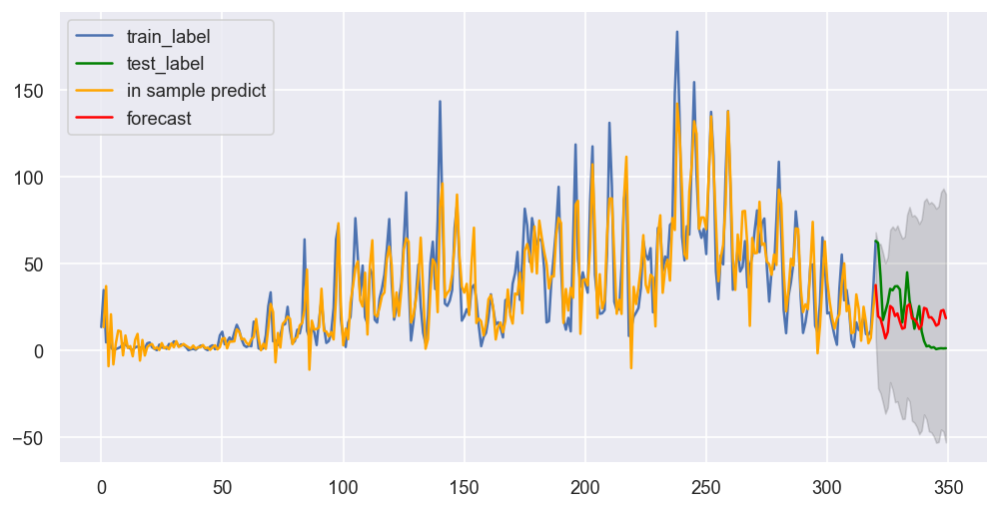

In [ ]:
fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(a_u.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(a_u.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(a_u.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(a_u.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

## hourly

In [ ]:
a_u_h = df1.groupby(['date','hour','avgTemp']).agg({'usage_counts_x':'sum'}).reset_index()
a_u_h['date'] = pd.to_datetime(a_u_h['date'])
a_u_h['avgt_usage'] = a_u_h['usage_counts_x']/a_u_h['avgTemp']
a_u_h.head()

,date,hour,avgTemp,usage_counts_x,avgt_usage
0,2021-01-01,0,55.76,329480,5908.895265
1,2021-01-01,6,55.76,304334,5457.926829
2,2021-01-01,7,55.76,1941471,34818.346485
3,2021-01-01,8,55.76,4231510,75887.912482
4,2021-01-01,9,55.76,55245,990.763989


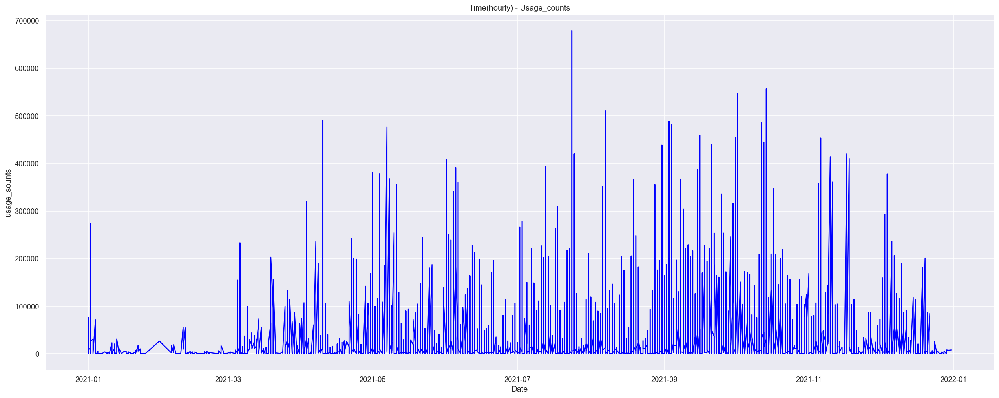

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time(hourly) - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_ai_line = plt.plot(a_u_h.date,a_u_h.avgt_usage, label = 'avgt_usage', color = 'blue')
plt.show()

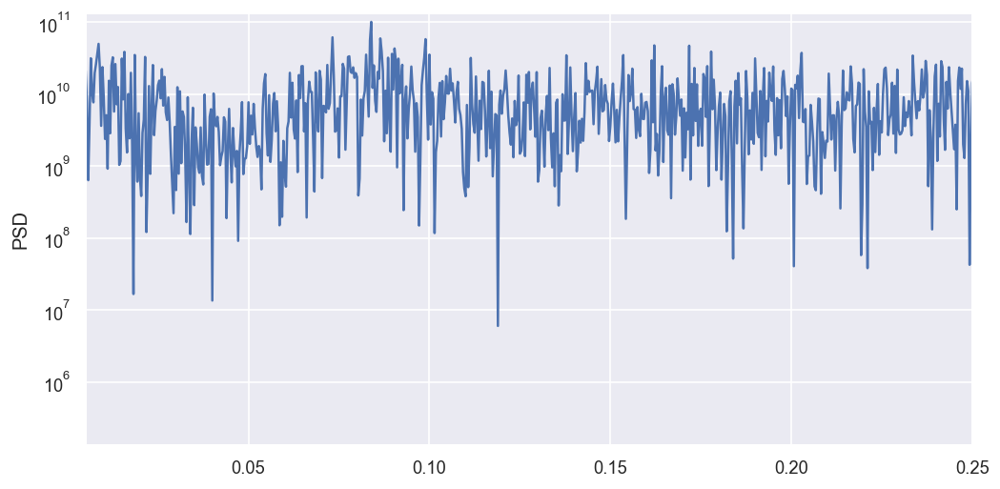

Strongest period length = 11.914893617021278


In [ ]:
f, PSD = scipy.signal.periodogram(a_u_h.avgt_usage)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

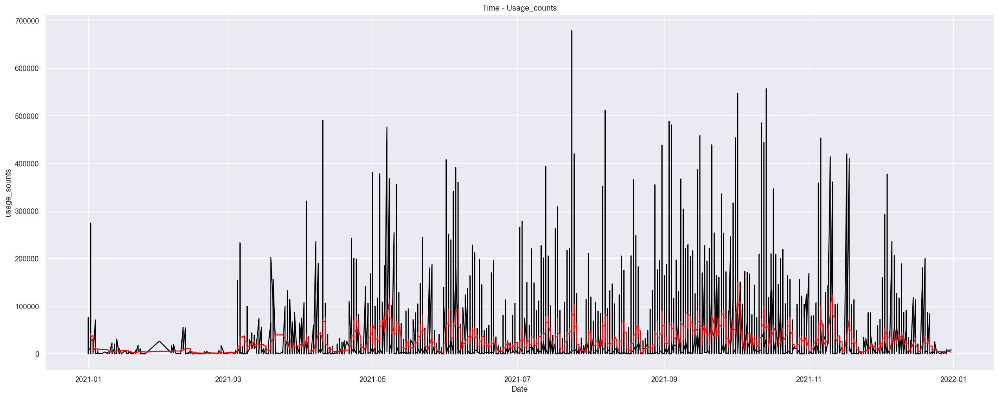

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time - Usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_white_line = plt.plot(a_u_h.date,a_u_h.avgt_usage, label = 'avgt_usage', color = 'black')
FHV_mean_line = plt.plot(a_u_h.date,a_u_h.avgt_usage.rolling(window = 12).mean(), label='avgt_usage Mean', linestyle='-',color='red')

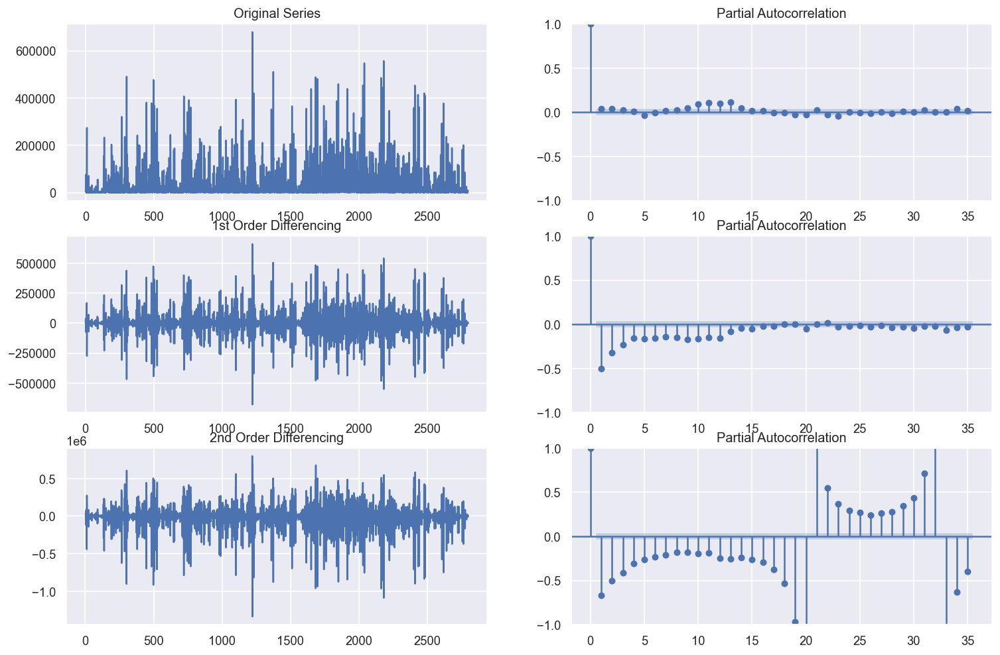

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= a_u_h.avgt_usage

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
series= a_u_h.avgt_usage

# raw
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
result = adfuller(series.diff().dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
result = adfuller(series.diff().diff().dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -8.682541
  p-value: 0.000000

1st order differencing:
  ADF Statistic: -25.120321
  p-value: 0.000000

2nd order differencing:
  ADF Statistic: -19.872301
  p-value: 0.000000


#### HOURLY-U/aT-ARIMA(1，1，12)

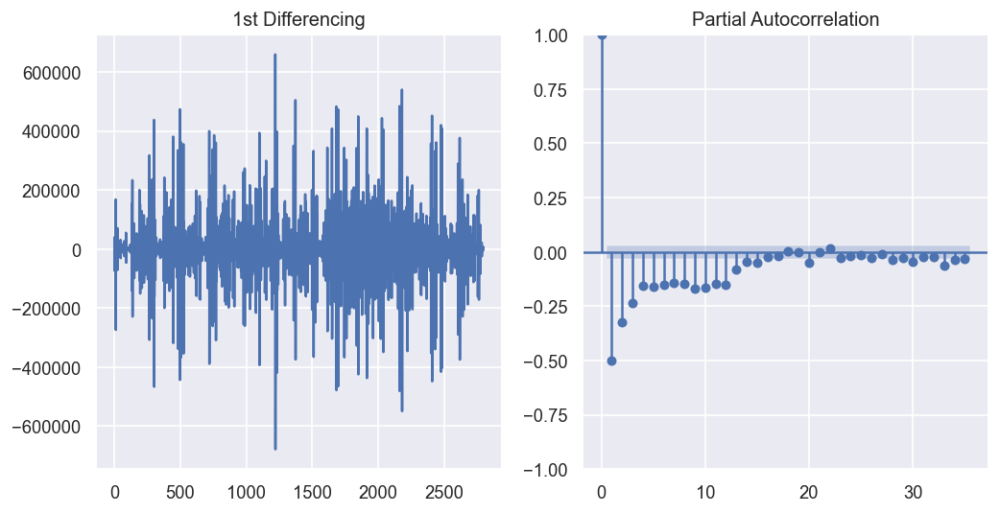

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(series.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

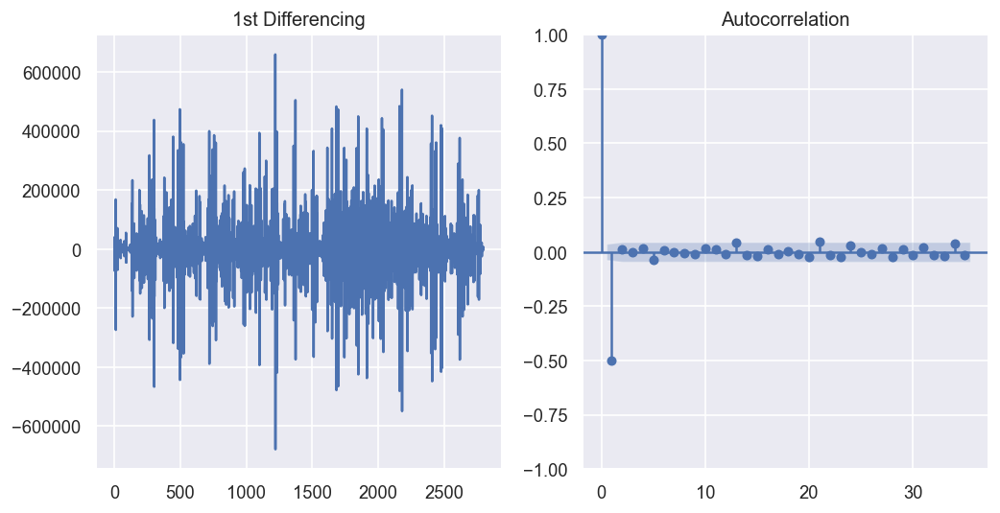

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff()); axes[0].set_title('1st Differencing')
plot_acf(series.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:             avgt_usage   No. Observations:                 2750
Model:                ARIMA(12, 1, 1)   Log Likelihood              -34433.236
Date:                Mon, 25 Apr 2022   AIC                          68894.472
Time:                        21:53:03   BIC                          68977.338
Sample:                             0   HQIC                         68924.412
                               - 2750                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3700      0.061     -6.065      0.000      -0.490      -0.250
ar.L2         -0.3503      0.059     -5.940      0.000      -0.466      -0.235
ar.L3         -0.3451      0.056     -6.185      0.0

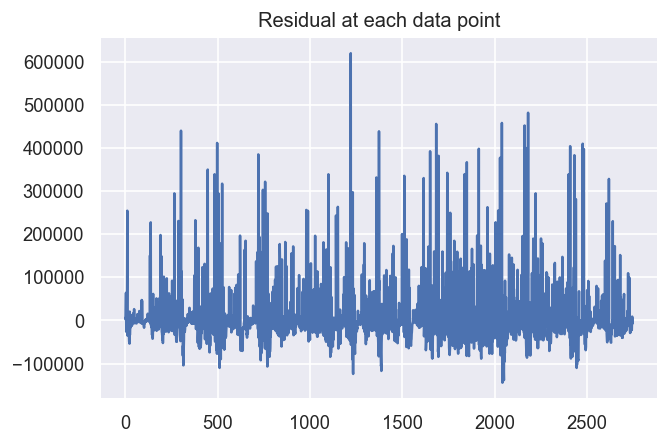

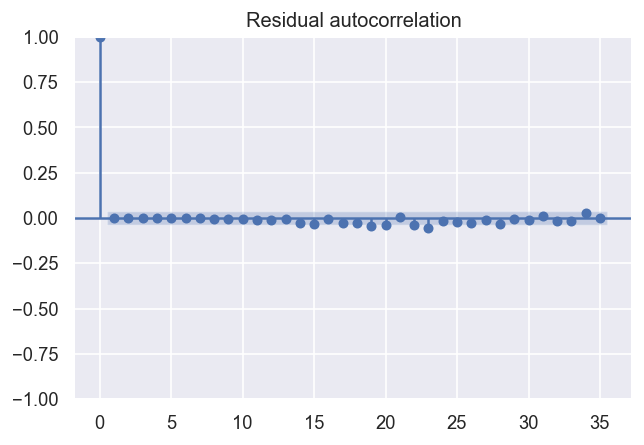

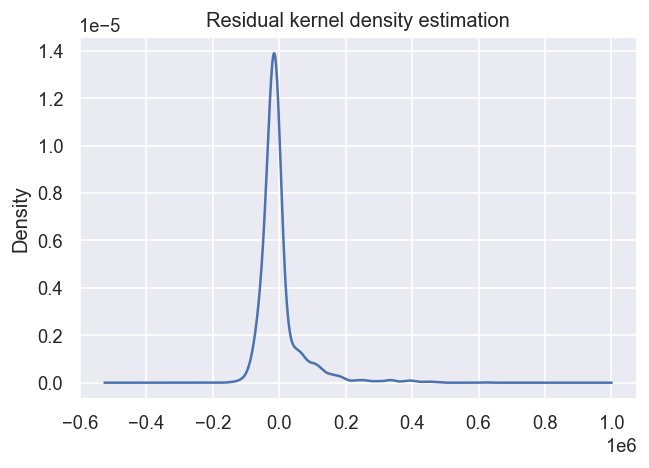

                   0
count    2750.000000
mean      -37.457889
std     66613.560293
min   -144472.943315
25%    -29898.368712
50%    -13577.607864
75%      2680.441286
max    619304.175458
p value is  0.0
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
     lb_stat  lb_pvalue
1   0.002218   0.962433
2   0.003804   0.998100
3   0.003804   0.999938
4   0.003879   0.999998
5   0.010374   0.999999
6   0.022966   1.000000
7   0.045758   1.000000
8   0.115980   1.000000
9   0.203939   0.999999
10  0.336572   0.999999


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=1
D=1
Q=12

# fit model
N= 2750
series= a_u_h.avgt_usage

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

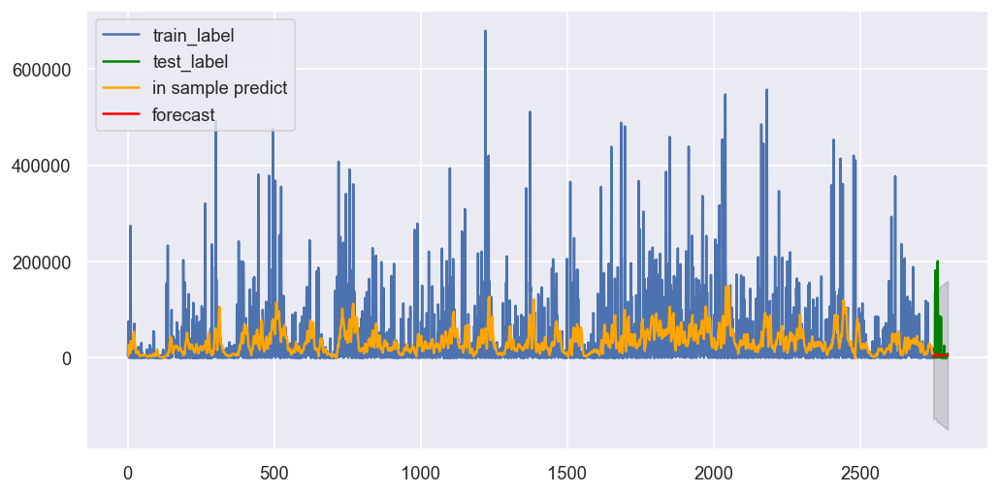

In [ ]:
# Forecast

fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(a_u_h.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(a_u_h.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(a_u_h.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(a_u_h.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

# 16_earnings - usage_counts

## Daily

In [ ]:
e_u = df.groupby(['trip_date']).agg({'usage_counts':'sum','population_16_years_and_over_with_earnings':'mean'}).reset_index()
e_u['trip_date'] = pd.to_datetime(e_u['trip_date'])
e_u['ave_usage'] = e_u['usage_counts']/e_u['population_16_years_and_over_with_earnings']
e_u.dropna().head()

,trip_date,usage_counts,population_16_years_and_over_with_earnings,ave_usage
0,2021-01-01,744,28126.227723,0.026452
1,2021-01-02,1871,29122.529880,0.064246
2,2021-01-03,244,26992.477876,0.009040
3,2021-01-04,501,25899.983607,0.019344
4,2021-01-05,91,29632.034483,0.003071


In [ ]:
e_u['ave_usage'].isnull().sum()

0

In [ ]:
len(e_u)

351

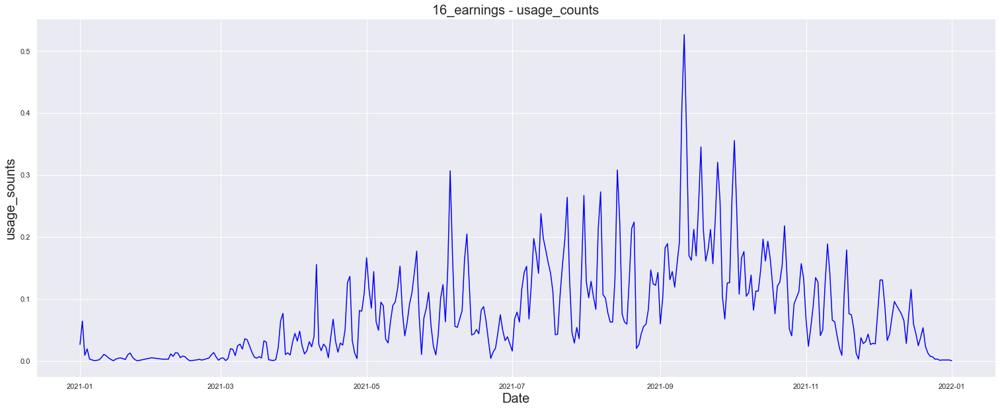

In [ ]:
plt.figure(figsize = (26,10))
plt.title('16_earnings - usage_counts', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)
race_ai_line = plt.plot(e_u.trip_date,e_u.ave_usage, label = 'ave_usage', color = 'blue')
plt.show()

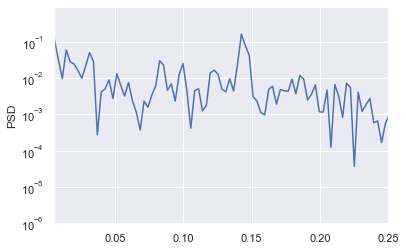

Strongest period length = 7.02


In [ ]:
f, PSD = scipy.signal.periodogram(e_u.ave_usage)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

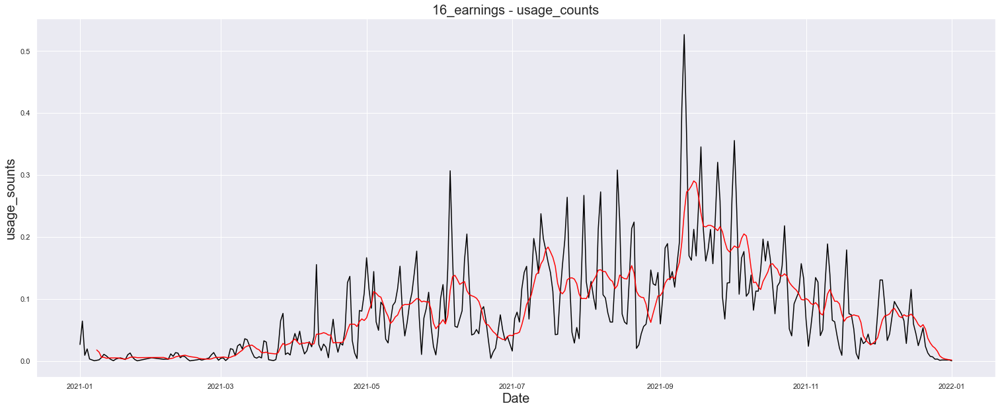

In [ ]:
plt.figure(figsize = (26,10))
plt.title('16_earnings - usage_counts', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)
race_white_line = plt.plot(e_u.trip_date,e_u.ave_usage, label = 'ave_usage', color = 'black')
FHV_mean_line = plt.plot(e_u.trip_date,e_u.ave_usage.rolling(window = 7).mean(), label='ave_usage Mean', linestyle='-',color='red')

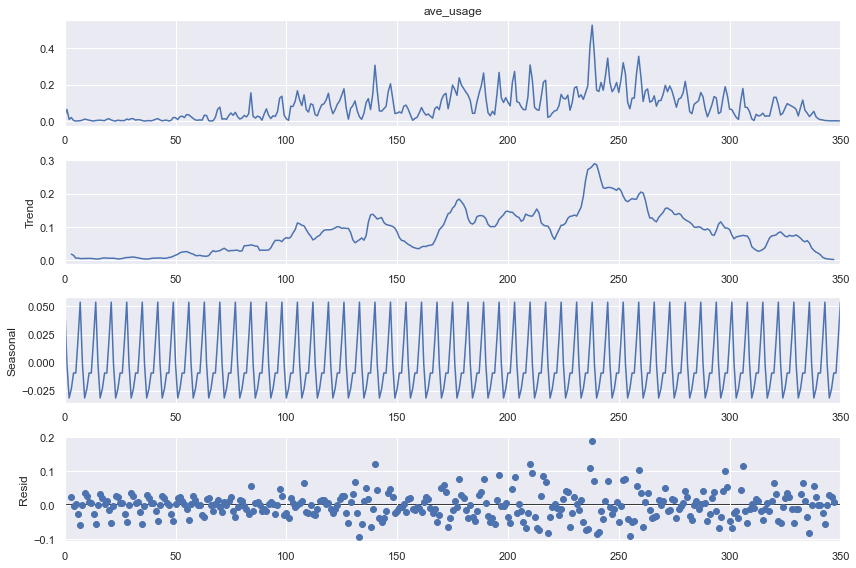

In [ ]:
matplotlib.rcParams['figure.figsize'] = [12, 8]
res = sm.tsa.seasonal_decompose(e_u.ave_usage,model='additive',period= 7)
res.plot()
plt.show()

### adf

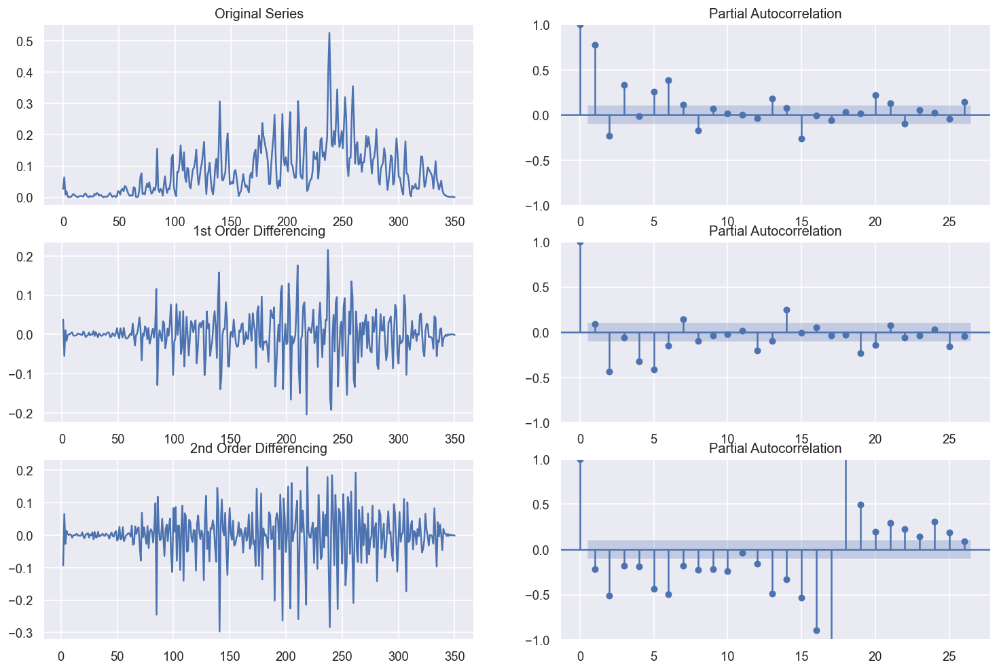

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= e_u.ave_usage

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
series= e_u.ave_usage

# raw
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
result = adfuller(series.diff().dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
result = adfuller(series.diff().diff().dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -2.128840
  p-value: 0.233077

1st order differencing:
  ADF Statistic: -5.725545
  p-value: 0.000001

2nd order differencing:
  ADF Statistic: -6.921304
  p-value: 0.000000


### ARIMA(2，1，19)

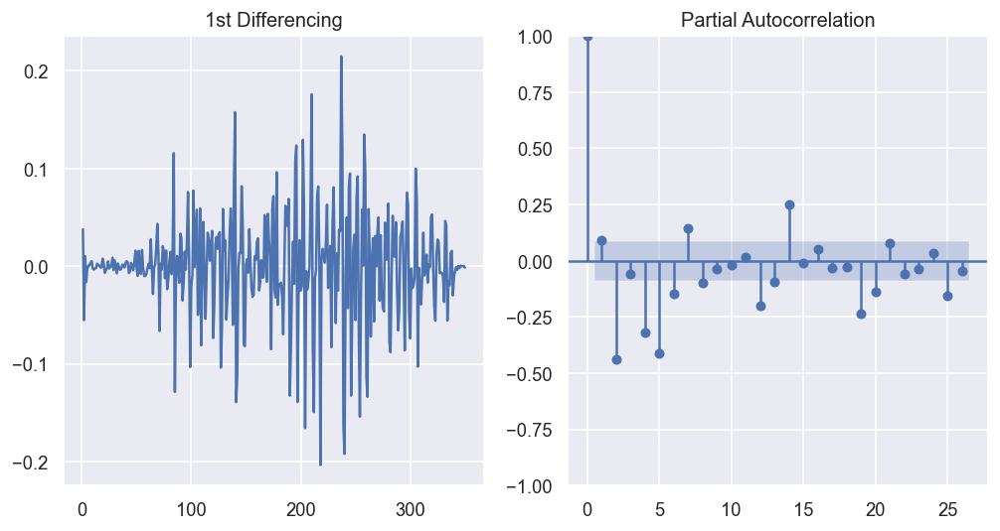

In [ ]:
series= e_u.ave_usage
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(series.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

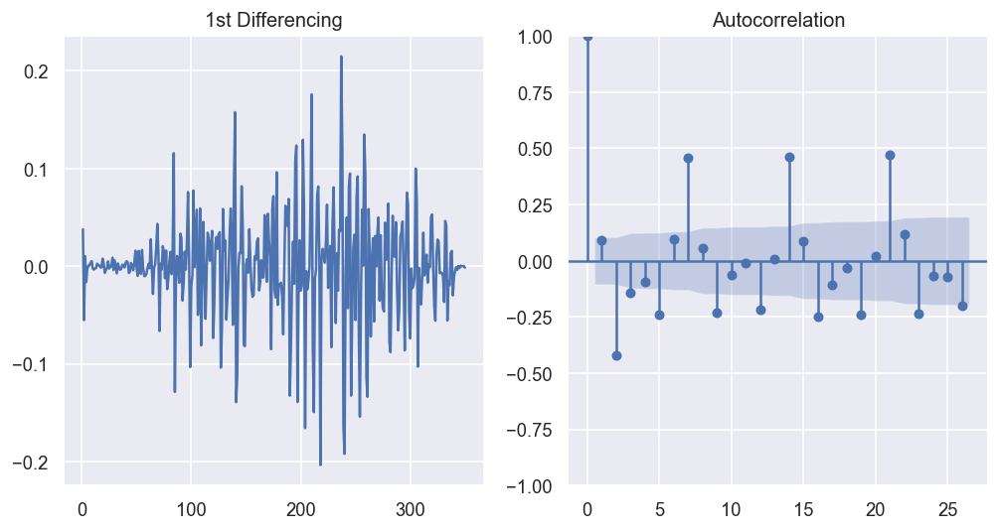

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff()); axes[0].set_title('1st Differencing')
plot_acf(series.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:              ave_usage   No. Observations:                  320
Model:                ARIMA(19, 1, 2)   Log Likelihood                 587.375
Date:                Tue, 26 Apr 2022   AIC                          -1130.751
Time:                        19:20:20   BIC                          -1047.917
Sample:                             0   HQIC                         -1097.670
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0582      0.332      0.176      0.861      -0.592       0.708
ar.L2         -0.2563      0.331     -0.775      0.438      -0.904       0.392
ar.L3         -0.1758      0.169     -1.040      0.2

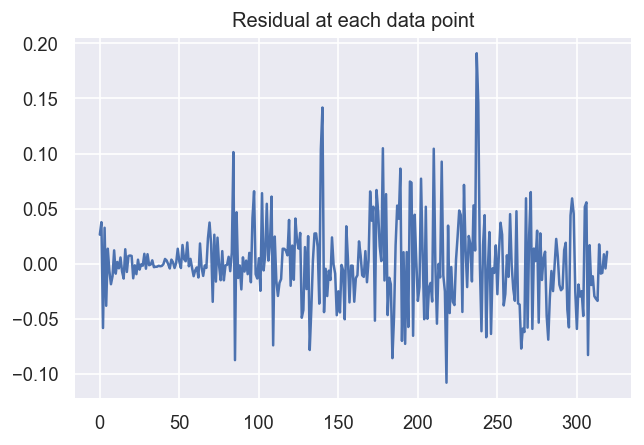

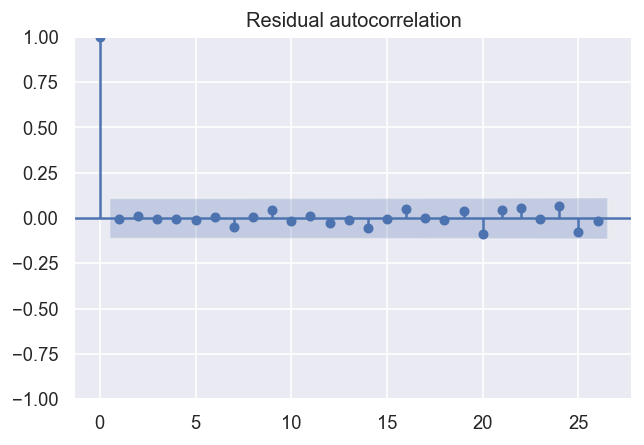

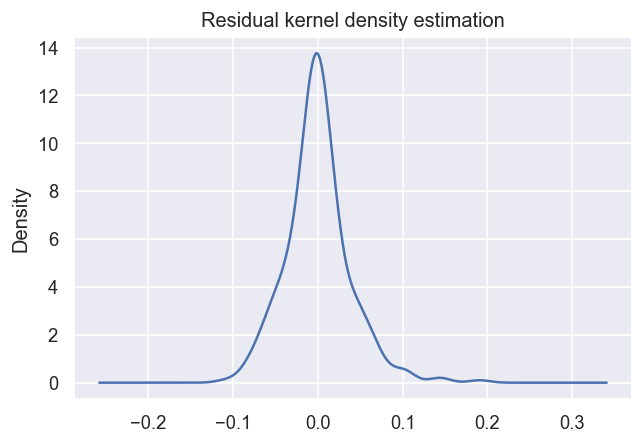

                0
count  320.000000
mean     0.000499
std      0.038295
min     -0.107806
25%     -0.018814
50%     -0.001495
75%      0.016782
max      0.191009
p value is  5.1185569944911216e-12
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
     lb_stat  lb_pvalue
1   0.018682   0.891282
2   0.057582   0.971620
3   0.066808   0.995498
4   0.080367   0.999214
5   0.120073   0.999745
6   0.124624   0.999962
7   0.969632   0.995304
8   0.972008   0.998419
9   1.671799   0.995660
10  1.786784   0.997728


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=2
D=1
Q=19

# fit model
N=320 
series= e_u.ave_usage

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

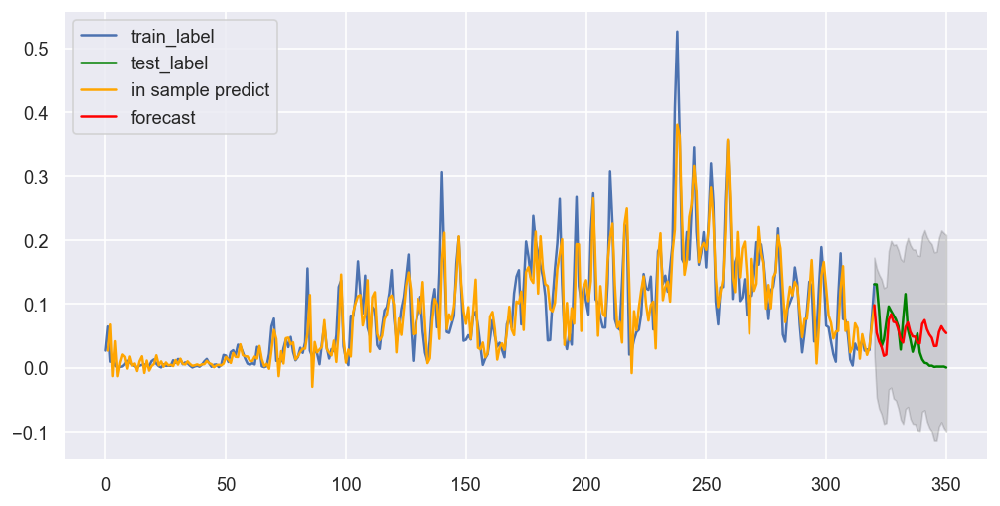

In [ ]:
fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(e_u.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(e_u.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(e_u.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(e_u.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

## hourly

In [ ]:
e_u_h = df1.groupby(['date','hour']).agg({'usage_counts_x':'sum','population_over16_with_earnings':'mean'}).reset_index()
e_u_h['date'] = pd.to_datetime(e_u_h['date'])
e_u_h['ave_usage'] = e_u_h['usage_counts_x']/e_u_h['population_over16_with_earnings']
e_u_h.head()

,date,hour,usage_counts_x,population_over16_with_earnings,ave_usage
0,2021-01-01,0,329480,32071.000000,10.273456
1,2021-01-01,6,304334,31226.259259,9.746092
2,2021-01-01,7,1941471,34867.000000,55.682192
3,2021-01-01,8,4231510,28842.031250,146.713314
4,2021-01-01,9,55245,17978.000000,3.072922


In [ ]:
e_u_h['ave_usage'].isnull().sum()

0

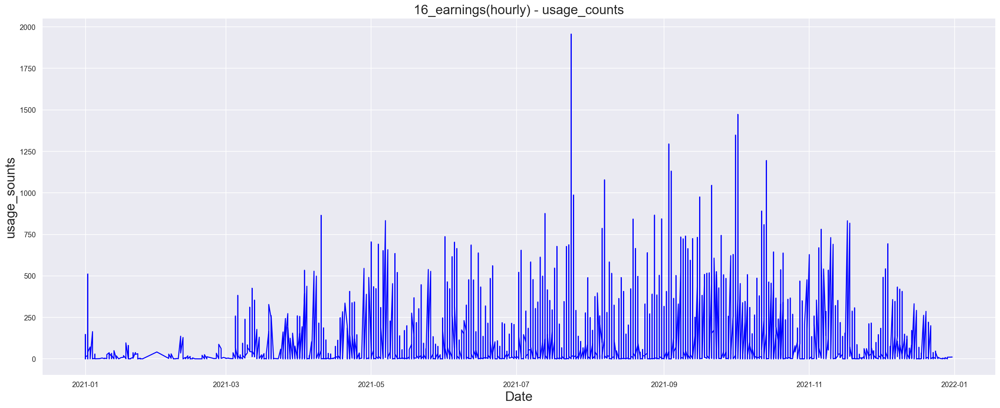

In [ ]:
plt.figure(figsize = (26,10))
plt.title('16_earnings(hourly) - usage_counts', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)
race_ai_line = plt.plot(e_u_h.date,e_u_h.ave_usage, label = 'ave_usage', color = 'blue')
plt.show()

#### can not deal with decompose

In [ ]:
# f, PSD = scipy.signal.periodogram(e_u_h.ave_usage)
# plt.semilogy(f, PSD)
# plt.ylabel('PSD')
# plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
# plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

# #filter outputs - periods shorter than 2 years (approx 100 weeks) 
# PSD = PSD[f>0.01]
# f = f[f>0.01] 
# plt.show()
# print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

# #transformting the frequency into the period length, using 1=frequency (number of periods)*period length

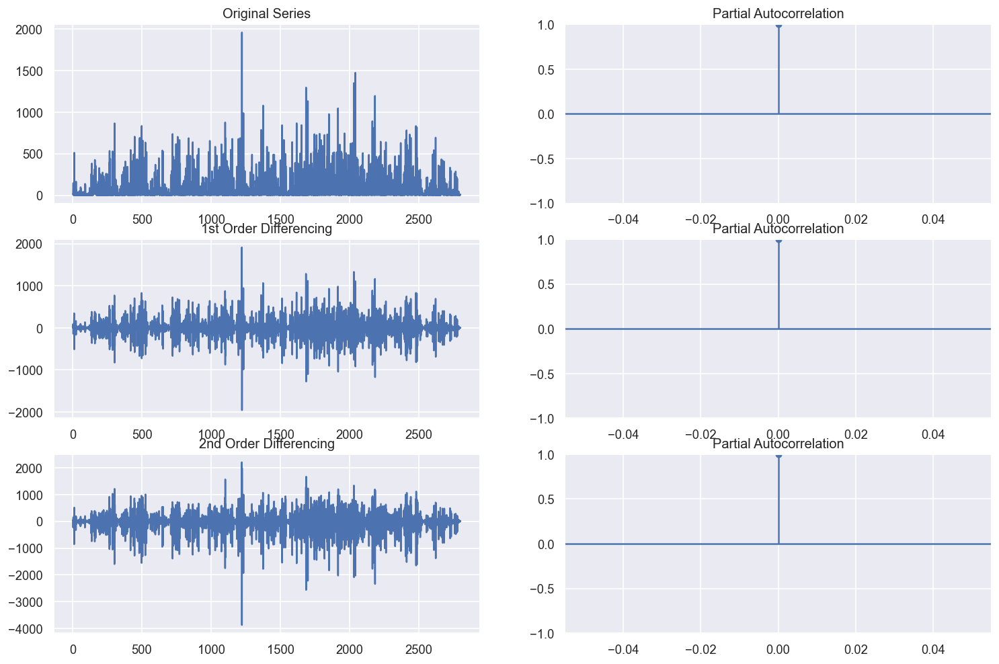

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= e_u_h.ave_usage

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
# series= e_u_h.ave_usage.values

# # raw
# result = adfuller(series)
# print('raw observations:')
# print('  ADF Statistic: %f' % result[0])
# print('  p-value: %f' % result[1])


# # first order differencing
# result = adfuller(series.diff().dropna())
# print('\n1st order differencing:')
# print('  ADF Statistic: %f' % result[0])
# print('  p-value: %f' % result[1])

# # second order differencing
# result = adfuller(series.diff().diff().dropna())
# print('\n2nd order differencing:')
# print('  ADF Statistic: %f' % result[0])
# print('  p-value: %f' % result[1])

# Median_earnings - Usage

## Daily

In [ ]:
mu = df.groupby(['trip_date']).agg({'usage_counts':'sum','median_earnings_(dollars)':'mean'}).reset_index()
mu['trip_date'] = pd.to_datetime(mu['trip_date'])
mu['avg_usage'] = mu['usage_counts']/mu['median_earnings_(dollars)']
mu.dropna().head()

,trip_date,usage_counts,median_earnings_(dollars),avg_usage
0,2021-01-01,744,70089.485149,0.010615
1,2021-01-02,1871,72573.725100,0.025781
2,2021-01-03,244,81824.876106,0.002982
3,2021-01-04,501,85533.172131,0.005857
4,2021-01-05,91,84414.206897,0.001078


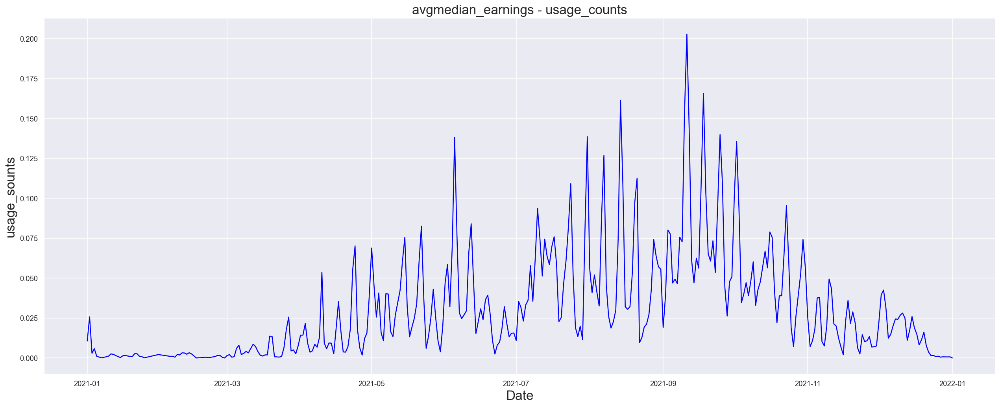

In [ ]:
plt.figure(figsize = (26,10))
plt.title('avgmedian_earnings - usage_counts', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)
race_ai_line = plt.plot(mu.trip_date,mu.avg_usage, label = 'usage_counts', color = 'blue')
plt.show()

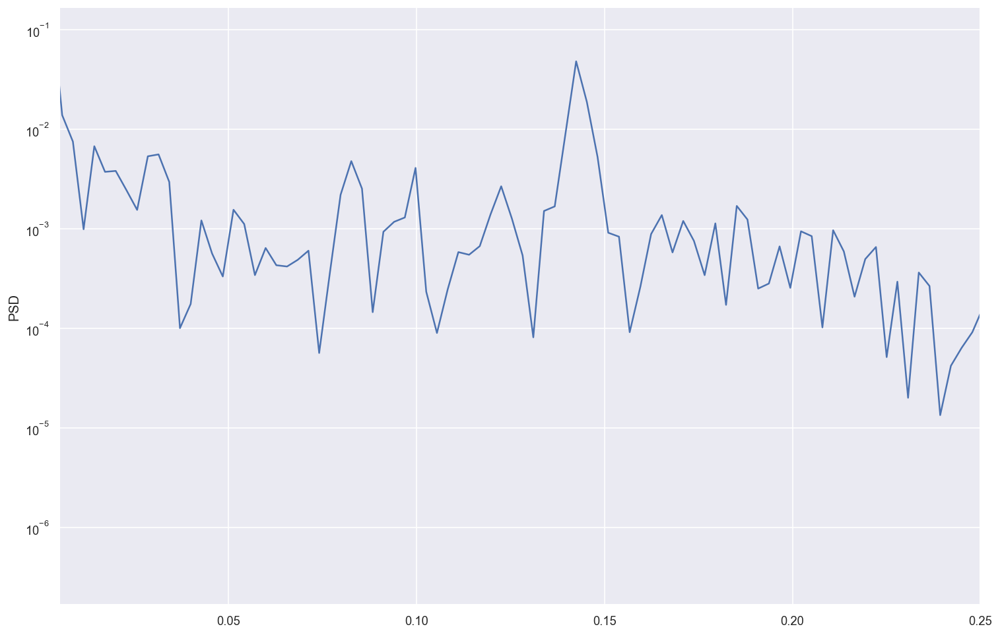

Strongest period length = 7.02


In [ ]:
f, PSD = scipy.signal.periodogram(mu.avg_usage)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

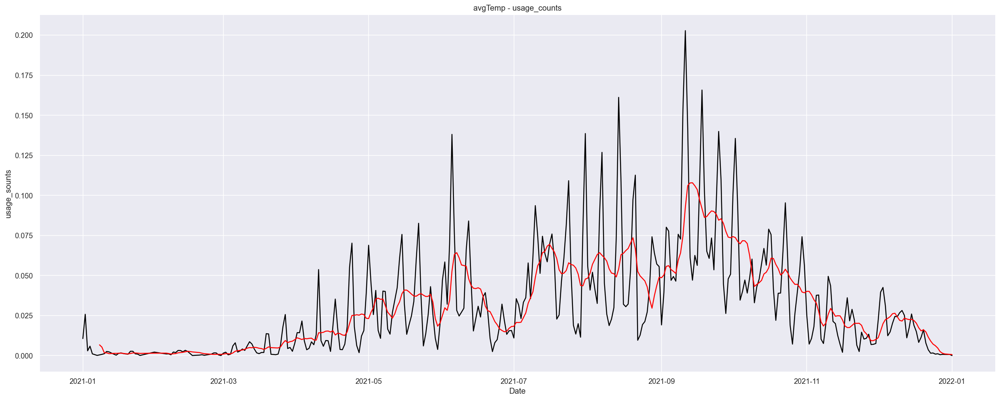

In [ ]:
plt.figure(figsize = (26,10))
plt.title('avgTemp - usage_counts')
plt.xlabel('Date')
plt.ylabel('usage_sounts')
race_white_line = plt.plot(mu.trip_date,mu.avg_usage, label = 'avg_usage', color = 'black')
FHV_mean_line = plt.plot(mu.trip_date,mu.avg_usage.rolling(window = 7).mean(), label='avg_usage Mean', linestyle='-',color='red')

### ADF

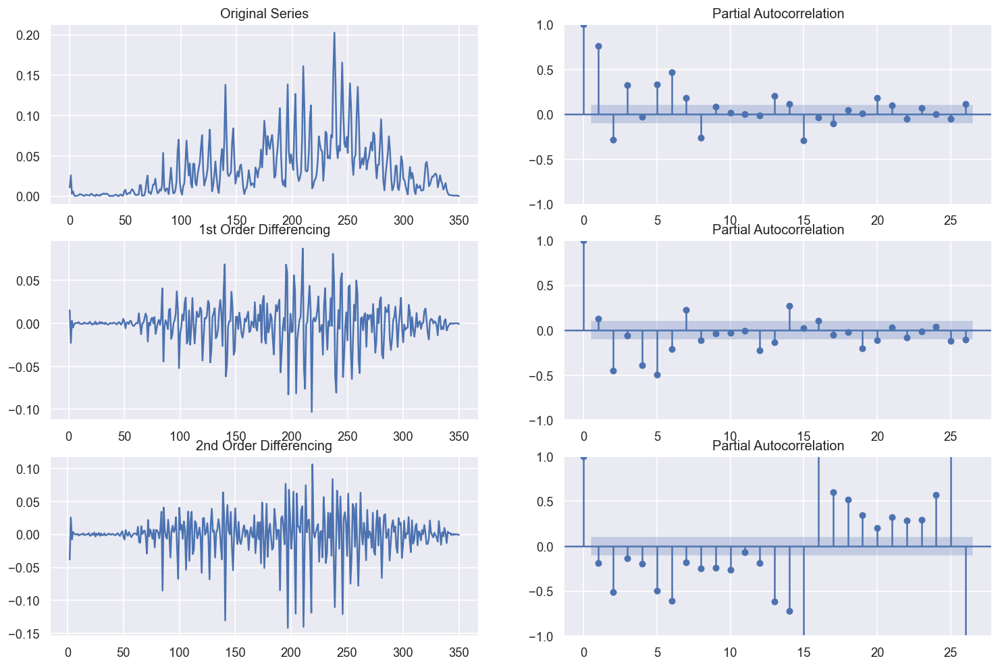

In [ ]:
#from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(15,10), 'figure.dpi':120})
series= mu.avg_usage

# Original Series
fig, axes = plt.subplots(3, 2)
axes[0, 0].plot(series); axes[0, 0].set_title('Original Series')
plot_pacf(series, ax=axes[0, 1])
axes[0, 1].set_title('Partial Autocorrelation')

# 1st Differencing
axes[1, 0].plot(series.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_pacf(series.diff().dropna(), ax=axes[1, 1])
axes[1, 1].set_title('Partial Autocorrelation')

# 2nd Differencing
axes[2, 0].plot(series.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_pacf(series.diff().diff().dropna(), ax=axes[2, 1])
axes[2, 1].set_title('Partial Autocorrelation')

plt.show()

In [ ]:
series= mu.avg_usage

# raw
result = adfuller(series.dropna())
print('raw observations:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])


# first order differencing
result = adfuller(series.diff().dropna())
print('\n1st order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

# second order differencing
result = adfuller(series.diff().diff().dropna())
print('\n2nd order differencing:')
print('  ADF Statistic: %f' % result[0])
print('  p-value: %f' % result[1])

raw observations:
  ADF Statistic: -2.095220
  p-value: 0.246441

1st order differencing:
  ADF Statistic: -5.925834
  p-value: 0.000000

2nd order differencing:
  ADF Statistic: -11.618803
  p-value: 0.000000


### ARIMA(2，1，5)

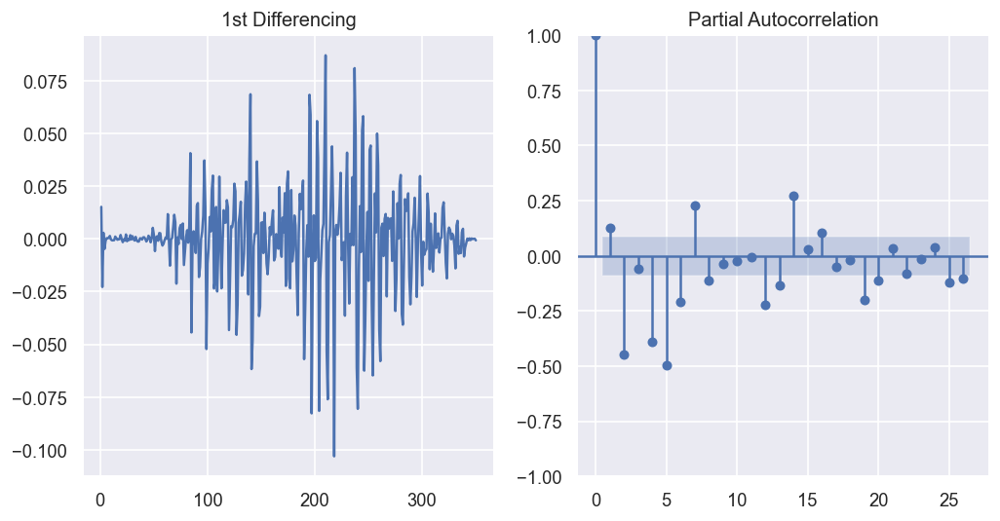

In [ ]:
series= mu.avg_usage
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff())
axes[0].set_title('1st Differencing')
# axes[1].set_ylim(0,1)
plot_pacf(series.diff().dropna(), ax=axes[1],alpha=0.1) #plot differences between consequtive observations

plt.show()

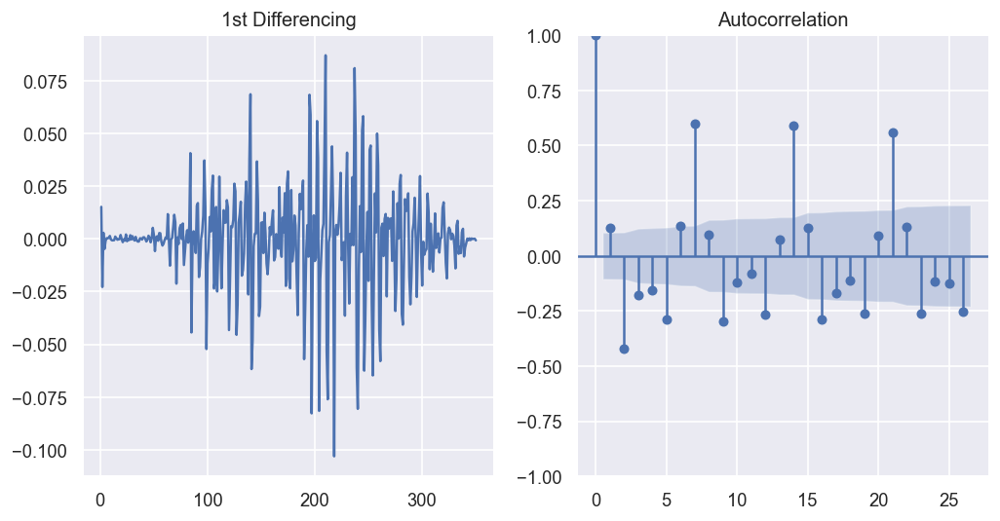

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))
axes[0].plot(series.diff()); axes[0].set_title('1st Differencing')
plot_acf(series.diff().dropna(), ax=axes[1])

plt.show()

                               SARIMAX Results                                
Dep. Variable:              avg_usage   No. Observations:                  320
Model:                 ARIMA(5, 1, 2)   Log Likelihood                 843.424
Date:                Tue, 26 Apr 2022   AIC                          -1670.848
Time:                        19:40:01   BIC                          -1640.726
Sample:                             0   HQIC                         -1658.818
                                - 320                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0271      0.068     -0.396      0.692      -0.161       0.107
ar.L2         -0.6436      0.071     -9.050      0.000      -0.783      -0.504
ar.L3         -0.3245      0.065     -4.998      0.0

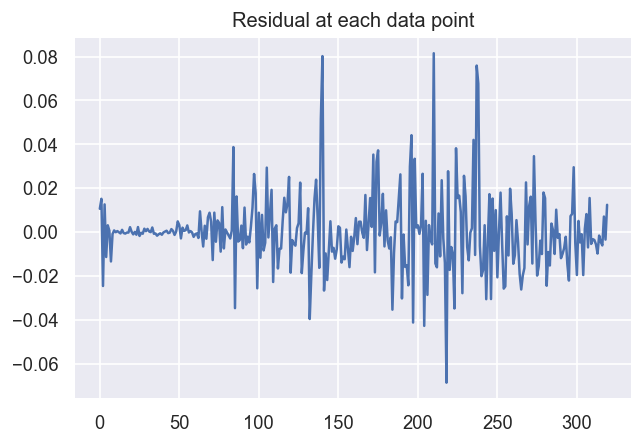

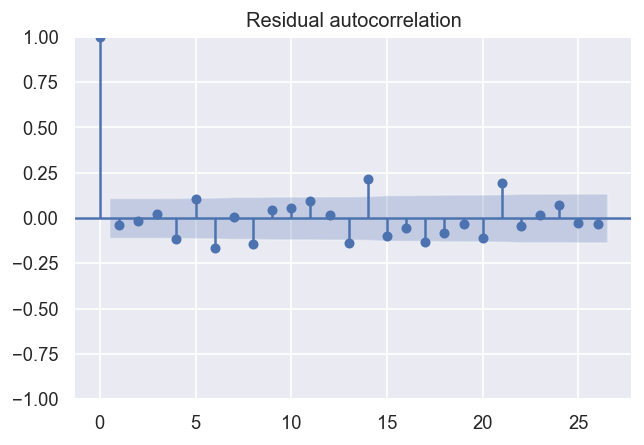

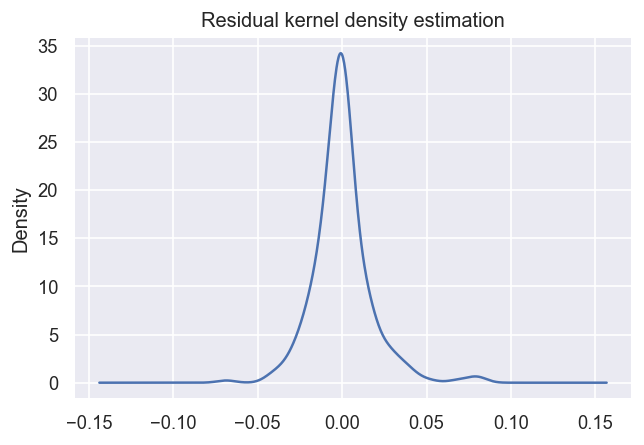

                0
count  320.000000
mean     0.000082
std      0.017184
min     -0.068697
25%     -0.007872
50%     -0.000590
75%      0.005191
max      0.081545
p value is  9.848025195092561e-19
null hypothesis: residuals come from a normal distribution
The null hypothesis can be rejected
Ljung–Box:
      lb_stat  lb_pvalue
1    0.552311   0.457375
2    0.630057   0.729768
3    0.779733   0.854308
4    5.044419   0.282770
5    8.673802   0.122804
6   17.842419   0.006638
7   17.847033   0.012680
8   24.567742   0.001839
9   25.161146   0.002798
10  26.084126   0.003629


In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from matplotlib import pyplot
plt.rcParams.update({'figure.figsize':(6,4), 'figure.dpi':120})

P=2
D=1
Q=5

# fit model
N=320 
series= mu.avg_usage

#model = sm.tsa.SARIMAX(series[:N], order=(Q,D,P))
model = sm.tsa.ARIMA(series[:N], order=(Q,D,P))
model_fit = model.fit()
print(model_fit.summary())

# plot residual errors
residuals = pd.DataFrame(model_fit.resid)
plt.plot(residuals)
plt.title('Residual at each data point')
plot_acf(residuals)
plt.title('Residual autocorrelation')
plt.show()
residuals.plot(kind='kde', legend=False)
plt.title('Residual kernel density estimation')
plt.show()
print(residuals.describe())
k2, p = scipy.stats.normaltest(residuals)
alpha = 0.1
print('p value is ',p[0])

print('null hypothesis: residuals come from a normal distribution')
if p < alpha:  
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")
    
print("Ljung–Box:")
print(sm.stats.acorr_ljungbox(residuals))

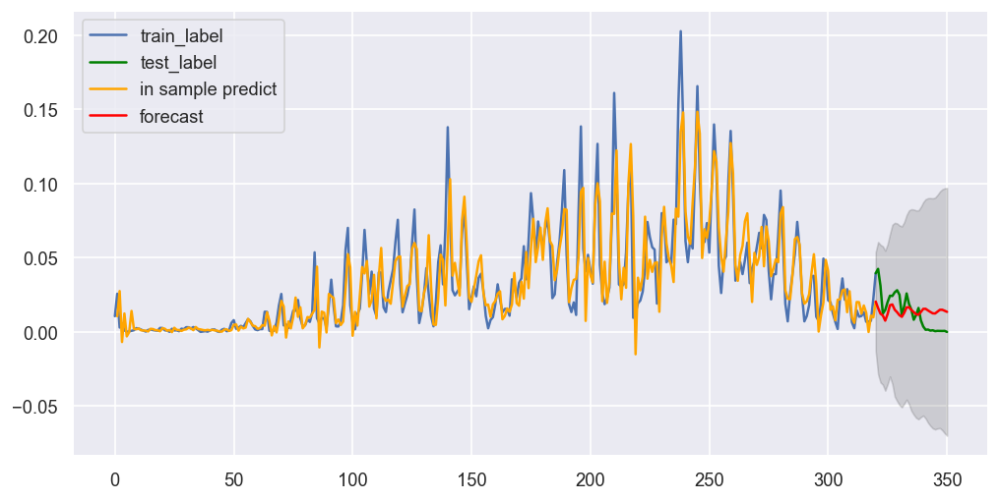

In [ ]:
fcast = model_fit.forecast(steps=len(series)-N)  # 95% conf
fc = model_fit.get_forecast(steps=len(series)-N).summary_frame()

fc_series = pd.Series(fc['mean'], index=range(N,len(series)))
#mean_series = pd.Series(fc['mean'], index=range(N,len(series)))
lower_series = pd.Series(fc.mean_ci_lower, index=range(N,len(series)))
upper_series = pd.Series(fc.mean_ci_upper, index=range(N,len(series)))

plt.rcParams.update({'figure.figsize':(10,5)})
fig, ax = plt.subplots()
ax.plot(mu.index[:N+1],series[:N+1],label='train_label') # train
ax.plot(mu.index[N:],series[N:],color='green',label='test_label') # test
ax.plot(mu.iloc[1:N+1].index,model_fit.predict(start=1,end=N,dynamic=False,typ='levels'),
        color='orange',label='in sample predict') # in-sample
ax.plot(fc_series, label='forecast', color='red') # forecast
ax.fill_between(mu.iloc[N:].index, lower_series, upper_series, color='k', alpha=.15) # conf
ax.legend(loc='upper left')

## Hourly(做不了)

In [ ]:
muh = df1.groupby(['start_date/time']).agg({'usage_counts_x':'sum','median_earnings':'mean'}).reset_index()
# muh['date'] = pd.to_datetime(muh['date'])
muh['avg_usage'] = muh['usage_counts_x']/muh['median_earnings']
muh.head()

,start_date/time,usage_counts_x,median_earnings,avg_usage
0,2021-01-01 00:00:00,329480,83576.0,3.942280
1,2021-01-01 06:00:00,36,42218.0,0.000853
2,2021-01-01 08:00:00,4656,34120.0,0.136460
3,2021-01-01 09:00:00,57150,51763.0,1.104070
4,2021-01-01 12:00:00,364,25619.0,0.014208


In [ ]:
muh.tail()

,start_date/time,usage_counts_x,median_earnings,avg_usage
1618,2021-12-26 00:00:00,75867,78024.0,0.972355
1619,2021-12-28 09:00:00,8531,25619.0,0.332995
1620,2021-12-28 13:00:00,284533,84237.0,3.377767
1621,2021-12-29 13:00:00,694556,84237.0,8.245260
1622,2021-12-31 13:00:00,753677,84237.0,8.947102


In [ ]:
muh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1623 entries, 0 to 1622
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   start_date/time  1623 non-null   datetime64[ns]
 1   usage_counts_x   1623 non-null   int64         
 2   median_earnings  1619 non-null   float64       
 3   avg_usage        1619 non-null   float64       
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 50.8 KB


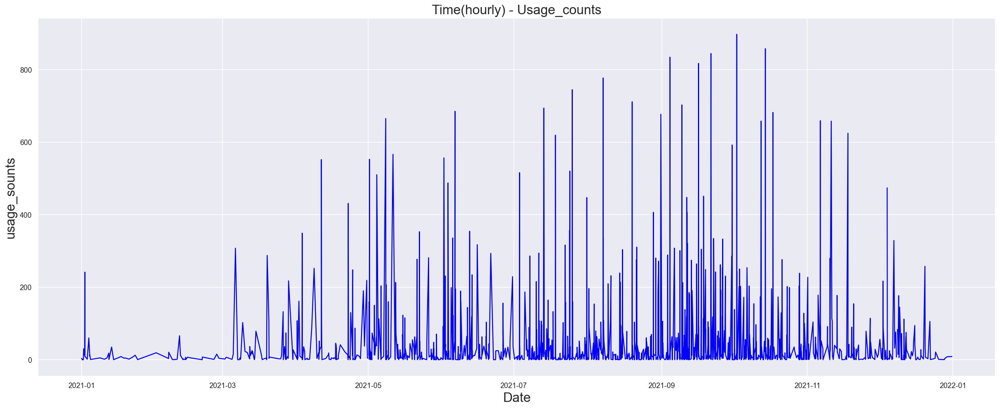

In [ ]:
plt.figure(figsize = (26,10))
plt.title('Time(hourly) - Usage_counts', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)
race_ai_line = plt.plot(muh['start_date/time'],muh.avg_usage, label = 'avg_usage', color = 'blue')
plt.show()

In [ ]:
# import matplotlib.dates as mdates

# fig, ax = plt.subplots(1, 1, figsize=(14, 6))

# # Change tickvalues to show all 24 hour values or less values
# locator = mdates.AutoDateLocator(minticks=12, maxticks=24)
# formatter = mdates.ConciseDateFormatter(locator)
# ax.xaxis.set_major_locator(locator)
# ax.xaxis.set_major_formatter(formatter)

# ax.plot(muh['start_date/time'],muh.avg_usage)

# # Set x limit values to same day
# ax.set_xlim((np.datetime64('2021-01-01 00:00'), np.datetime64('2021-12-31 13:00')))

In [ ]:
# f, PSD = scipy.signal.periodogram(muh.avg_usage)
# plt.semilogy(f, PSD)
# plt.ylabel('PSD')
# plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
# plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

# #filter outputs - periods shorter than 2 years (approx 100 weeks) 
# PSD = PSD[f>0.01]
# f = f[f>0.01] 
# plt.show()
# print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

# #transformting the frequency into the period length, using 1=frequency (number of periods)*period length

# All in one plot(Daily)

In [ ]:
colors = ["#337fe7","#C995A2","#5A7FA2","#31405F","#BFC6CC","#7C70B9","#FB993B","#81DDE6"]

In [ ]:
all_ = df.groupby(['trip_date']).agg({'usage_counts':'sum','total_population':'mean'}).reset_index()
all_['trip_date'] = pd.to_datetime(all_['trip_date'])
all_['avgt_usage'] = all_['usage_counts']/all_['total_population']
all_.head()

,trip_date,usage_counts,total_population,avgt_usage
0,2021-01-01,744,44254.633663,0.016812
1,2021-01-02,1871,45692.350598,0.040948
2,2021-01-03,244,41143.309735,0.005930
3,2021-01-04,501,39533.377049,0.012673
4,2021-01-05,91,45709.137931,0.001991


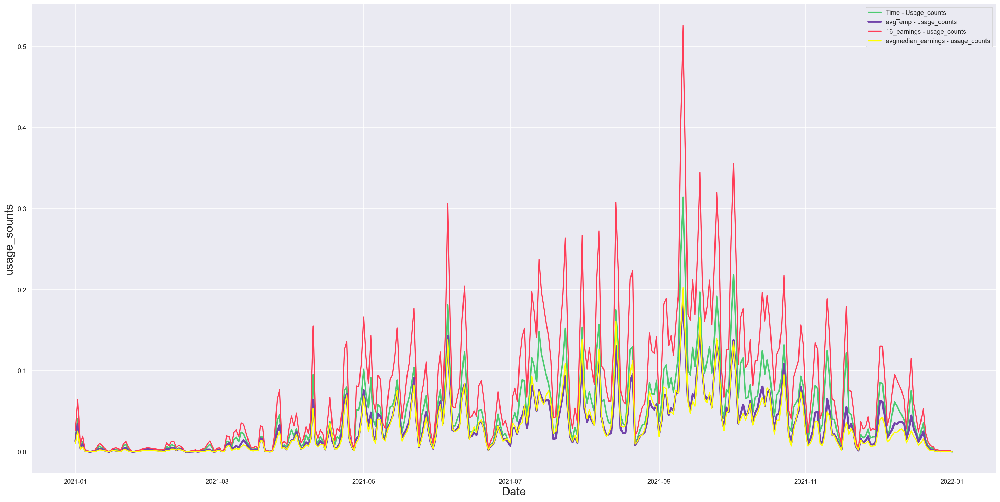

In [ ]:
plt.figure(figsize = (30,15))
plt.title('', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)

plt.plot(all_.trip_date,all_.avgt_usage, label = 'Time - Usage_counts', color = '#4ccb70',linewidth=2.5)
plt.plot(a_u.trip_date,(a_u.avgt_usage)/1000, label = 'avgTemp - usage_counts', color = '#7244aa',linewidth=3.5)
plt.plot(e_u.trip_date,e_u.ave_usage, label = '16_earnings - usage_counts', color = "#ff3d57",linewidth=2.0)
plt.plot(mu.trip_date,mu.avg_usage, label = 'avgmedian_earnings - usage_counts', color = 'yellow',linewidth=2.0)
plt.legend()
plt.show()

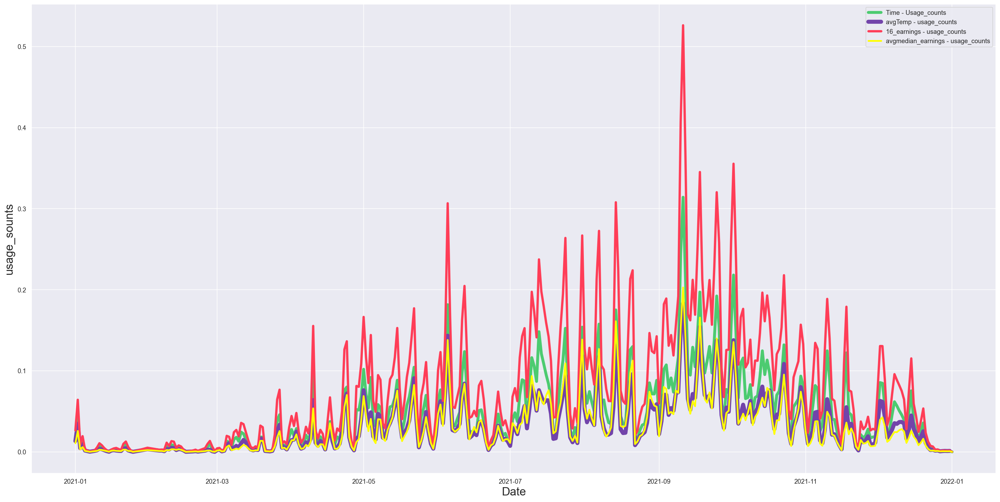

In [ ]:
plt.figure(figsize = (30,15))
plt.title('', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)

plt.plot(all_.trip_date,all_.avgt_usage, label = 'Time - Usage_counts', color = '#4ccb70',linewidth=5.0)
plt.plot(a_u.trip_date,(a_u.avgt_usage)/1000, label = 'avgTemp - usage_counts', color = '#7244aa',linewidth=7.0)
plt.plot(e_u.trip_date,e_u.ave_usage, label = '16_earnings - usage_counts', color = "#ff3d57",linewidth=4.0)
plt.plot(mu.trip_date,mu.avg_usage, label = 'avgmedian_earnings - usage_counts', color = 'yellow',linewidth=3.0)
plt.legend()
plt.show()

# All in one plot(Hourly)

In [ ]:
all_h = df1.groupby(['date','hour']).agg({'usage_counts_x':'sum','total_population':'mean'}).reset_index()
all_h['date'] = pd.to_datetime(all_h['date'])
all_h['avg_usage'] = all_h['usage_counts_x']/all_h['total_population']
all_h.head()

,date,hour,usage_counts_x,total_population,avg_usage
0,2021-01-01,0,329480,45498.000000,7.241637
1,2021-01-01,6,304334,44570.740741,6.828112
2,2021-01-01,7,1941471,54879.545455,35.376951
3,2021-01-01,8,4231510,43835.781250,96.530959
4,2021-01-01,9,55245,29747.000000,1.857162


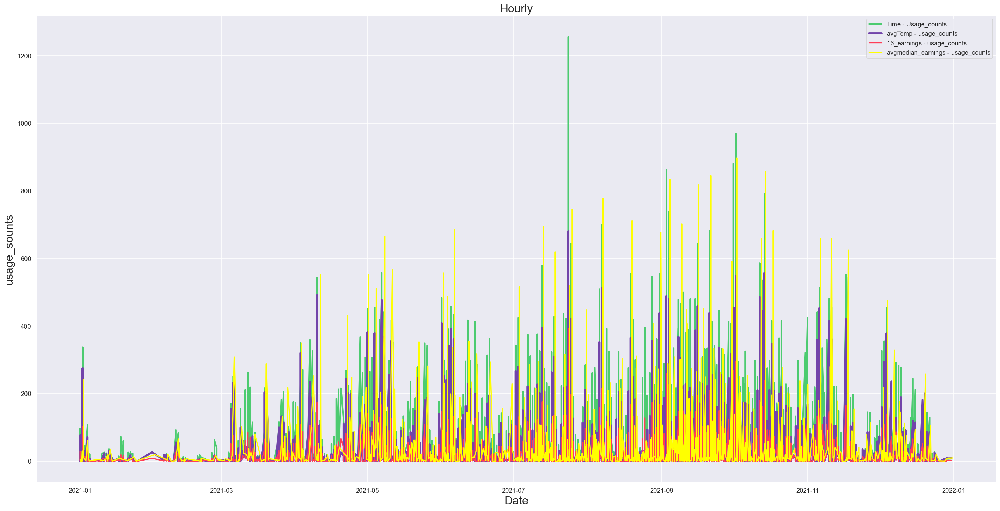

In [ ]:
plt.figure(figsize = (30,15))
plt.title('Hourly', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)

plt.plot(all_h.date,all_h.avg_usage, label = 'Time - Usage_counts', color = '#4ccb70',linewidth=2.5)
plt.plot(a_u_h.date,(a_u_h.avgt_usage)/1e3, label = 'avgTemp - usage_counts', color = '#7244aa',linewidth=3.5)
plt.plot(e_u_h.date,e_u_h.ave_usage/5, label = '16_earnings - usage_counts', color = "#ff3d57",linewidth=2.0)
plt.plot(muh['start_date/time'],muh.avg_usage, label = 'avgmedian_earnings - usage_counts', color = 'yellow',linewidth=2.0)
plt.legend()
plt.show()

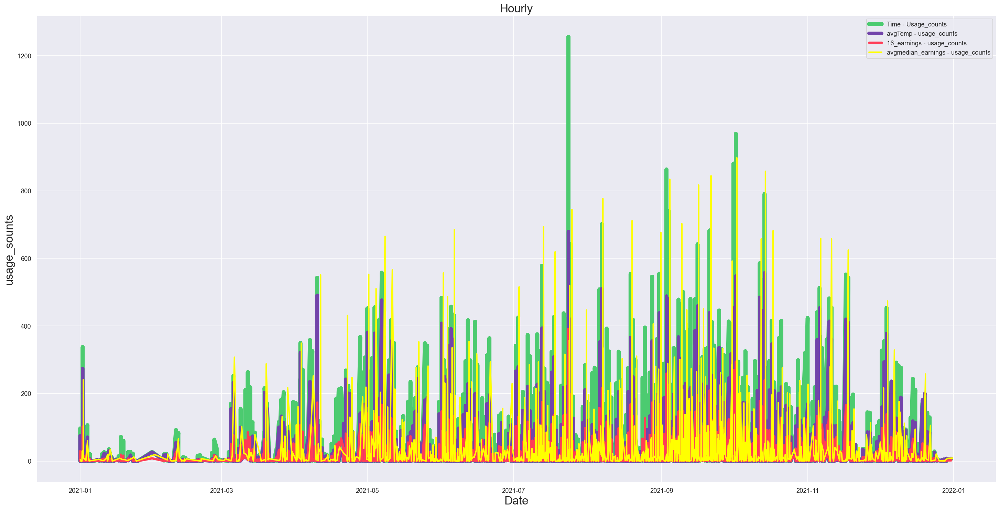

In [ ]:
plt.figure(figsize = (30,15))
plt.title('Hourly', fontsize = 20)
plt.xlabel('Date', fontsize = 20)
plt.ylabel('usage_sounts', fontsize = 20)

plt.plot(all_h.date,all_h.avg_usage, label = 'Time - Usage_counts', color = '#4ccb70',linewidth=7.0)
plt.plot(a_u_h.date,(a_u_h.avgt_usage)/1e3, label = 'avgTemp - usage_counts', color = '#7244aa',linewidth=6.0)
plt.plot(e_u_h.date,e_u_h.ave_usage/5, label = '16_earnings - usage_counts', color = "#ff3d57",linewidth=4.0)
plt.plot(muh['start_date/time'],muh.avg_usage, label = 'avgmedian_earnings - usage_counts', color = 'yellow',linewidth=2.5)
plt.legend()
plt.show()

# Time - Race



## DF

In [ ]:
ts_race = df1.groupby(['date']).agg({'white':'sum','black':'sum','american_indian':'sum','asian':'sum'}).reset_index()
ts_race.head()

,date,white,black,american_indian,asian
0,2021-01-01,22937310.0,3312229.0,122789.0,5055941.0
1,2021-01-02,60729761.0,8480272.0,234672.0,12297260.0
2,2021-01-03,6982329.0,773123.0,18929.0,1464375.0
3,2021-01-04,14831515.0,1543331.0,25539.0,3143991.0
4,2021-01-05,2719729.0,299995.0,7257.0,560824.0


In [ ]:
ts_race['date'] = pd.to_datetime(ts_race['date'])

In [ ]:
# get the number of samples
nsamp = len(ts_race)

# convert the `date` feature into `dt.datetime` format. This is for later datetime operations
Time = ts_race['date'].values

# print dataset characteristics
print('This is the original dataset characteristics:')
timeperiod = Time[-1] - Time[0] + pd.to_timedelta(1,unit='day')

# this is the duration of our observations: tail - head + 1 
print('The time period for this dataset is: ', timeperiod.days)
print('The number of observations are: ', nsamp)
print(ts_race.describe())

This is the original dataset characteristics:
The time period for this dataset is:  365
The number of observations are:  350
              white         black  american_indian         asian
count  3.500000e+02  3.500000e+02     3.500000e+02  3.500000e+02
mean   6.427062e+07  1.180540e+07     2.736035e+05  1.414513e+07
std    6.633901e+07  1.445309e+07     3.387900e+05  1.570196e+07
min    2.881000e+04  3.050000e+03     0.000000e+00  3.885000e+03
25%    1.305509e+07  1.515469e+06     3.170300e+04  2.839240e+06
50%    4.184818e+07  6.805421e+06     1.500930e+05  8.590582e+06
75%    9.965482e+07  1.583955e+07     3.789000e+05  2.081856e+07
max    3.788021e+08  7.937732e+07     2.333208e+06  1.013754e+08


In [ ]:
ts_race_ln = ts_race.set_index(['date'])
ts_race_ln = np.log(ts_race_ln)
ts_race_ln.head()

,white,black,american_indian,asian
date,,,,
2021-01-01,16.948275,15.013132,11.718223,15.436075
2021-01-02,17.921944,15.953253,12.365944,16.324887
2021-01-03,15.758893,13.558193,9.848450,14.196939
2021-01-04,16.512265,14.249454,10.147962,14.961004
2021-01-05,14.816043,12.611521,8.889722,13.237162


In [ ]:
# plt.figure(figsize = (26,10))
# plt.title('Time - Race : American_Indian')
# plt.xlabel('Date')
# plt.ylabel('log')
# race_ai_line = plt.plot(ts_race.date,ts_race.american_indian, label = 'american_indian', color = 'blue')
# plt.show()

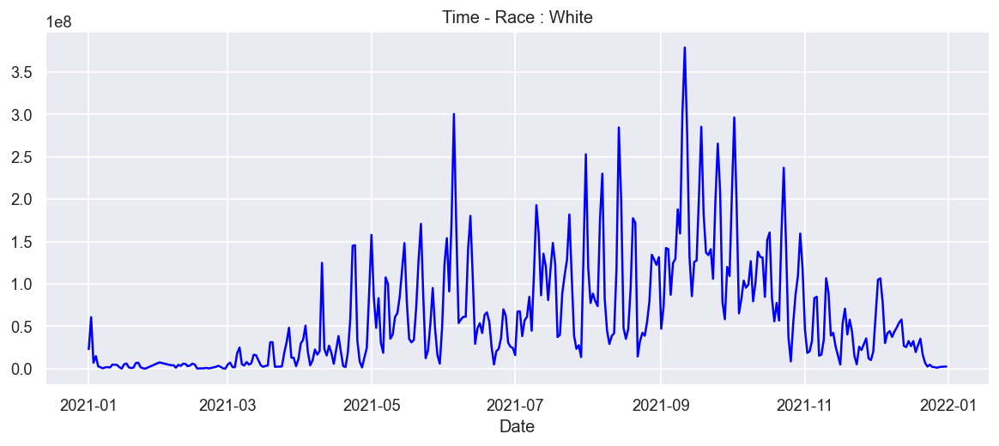

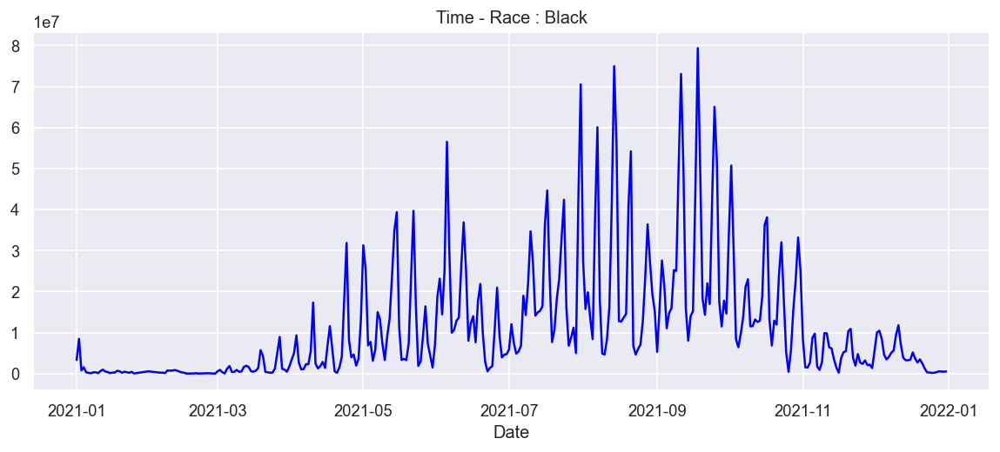

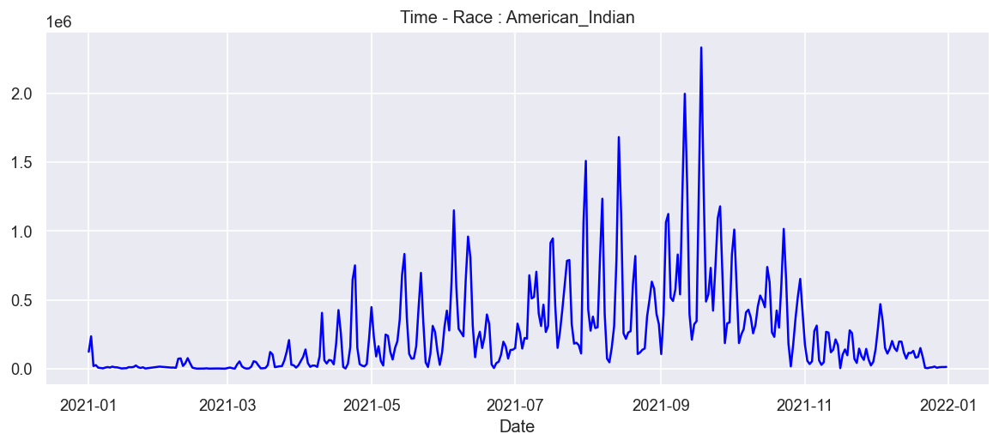

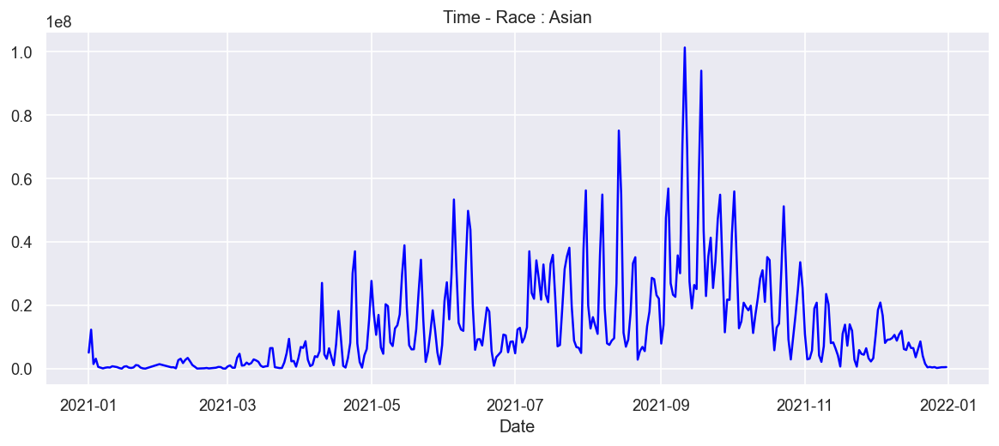

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math

plt.figure(figsize = (26,10))
plt.subplot(221)
plt.title('Time - Race : White')
plt.xlabel('Date')
race_white_line = plt.plot(ts_race.date,ts_race.white, label = 'white', color = 'blue')

plt.figure(figsize = (26,10))
plt.subplot(222)
plt.title('Time - Race : Black')
plt.xlabel('Date')
race_black_line = plt.plot(ts_race.date,ts_race.black, label = 'black', color = 'blue')

plt.figure(figsize = (26,10))
plt.subplot(223)
plt.title('Time - Race : American_Indian')
plt.xlabel('Date')
race_ai_line = plt.plot(ts_race.date,ts_race.american_indian, label = 'american_indian', color = 'blue')

plt.figure(figsize = (26,10))
plt.subplot(224)
plt.title('Time - Race : Asian')
plt.xlabel('Date')
race_asian_line = plt.plot(ts_race.date,ts_race.asian, label = 'asian', color = 'blue')

plt.show()

## sesonal decompse

### numbers

In [ ]:
ts_race.columns

Index(['date', 'white', 'black', 'american_indian', 'asian'], dtype='object')

white

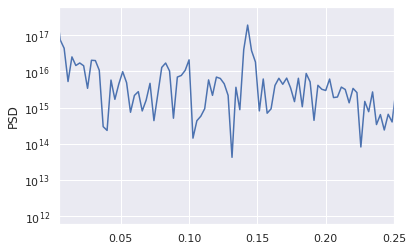

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_race.white)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

black

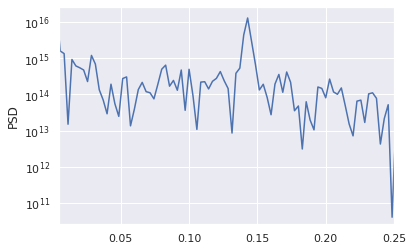

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_race.black)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

American_Indian

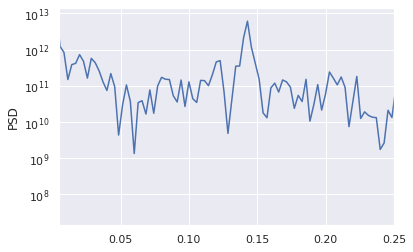

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_race.american_indian)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

Asian

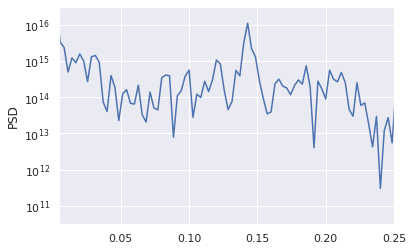

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_race.asian)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

### all_plot_decom_race

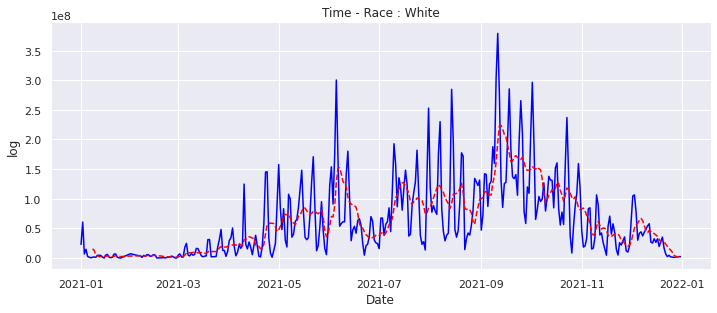

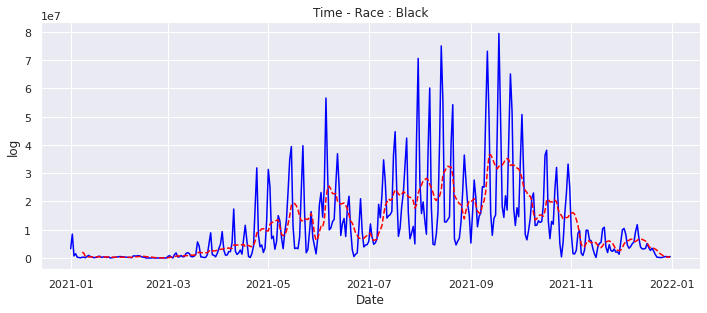

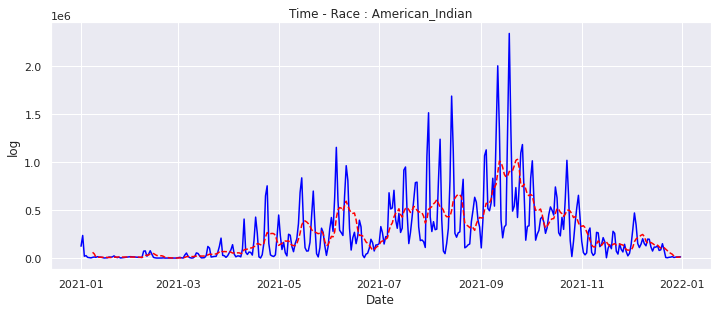

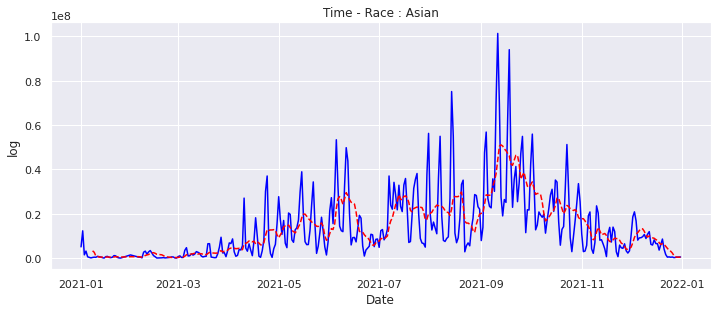

In [ ]:
plt.figure(figsize = (26,10))
plt.subplot(221)
plt.title('Time - Race : White')
plt.xlabel('Date')
plt.ylabel('log')
race_white_line = plt.plot(ts_race.date,ts_race.white, label = 'white', color = 'blue')
FHV_mean_line = plt.plot(ts_race.date,ts_race.white.rolling(window = 7).mean(), label='White Mean', linestyle='--',color='red')

plt.figure(figsize = (26,10))
plt.subplot(222)
plt.title('Time - Race : Black')
plt.xlabel('Date')
plt.ylabel('log')
race_black_line = plt.plot(ts_race.date,ts_race.black, label = 'black', color = 'blue')
FHV_mean_line = plt.plot(ts_race.date,ts_race.black.rolling(window = 7).mean(), label='Black Mean', linestyle='--',color='red')

plt.figure(figsize = (26,10))
plt.subplot(223)
plt.title('Time - Race : American_Indian')
plt.xlabel('Date')
plt.ylabel('log')
race_ai_line = plt.plot(ts_race.date,ts_race.american_indian, label = 'american_indian', color = 'blue')
FHV_mean_line = plt.plot(ts_race.date,ts_race.american_indian.rolling(window = 7).mean(), label='A_I Mean', linestyle='--',color='red')

plt.figure(figsize = (26,10))
plt.subplot(224)
plt.title('Time - Race : Asian')
plt.xlabel('Date')
plt.ylabel('log')
race_asian_line = plt.plot(ts_race.date,ts_race.asian, label = 'asian', color = 'blue')
FHV_mean_line = plt.plot(ts_race.date,ts_race.asian.rolling(window = 7).mean(), label='Aisan Mean', linestyle='--',color='red')

plt.show()

## Prediction

# Time - Pop/earnings/hur/temp

## df

In [ ]:
ts_ot = df1.groupby(['date']).agg({'population_over16_with_earnings':'mean','median_earnings':'mean',
                                   'total_population':'mean','median_age':'mean','Trip_Hour':'mean',
                                   'avgTemp':'mean'}).reset_index()
ts_ot['date'] = pd.to_datetime(ts_ot['date'])
ts_ot.head()

,date,population_over16_with_earnings,median_earnings,total_population,median_age,Trip_Hour,avgTemp
0,2021-01-01,30631.029570,75229.024194,46453.158602,36.150806,13.239247,55.76
1,2021-01-02,31252.851416,75777.817745,47643.089257,35.681400,14.059327,53.96
2,2021-01-03,26464.061475,82407.250000,40313.553279,35.179918,12.647541,53.60
3,2021-01-04,26999.546906,84876.009980,41118.051896,34.962076,13.219561,53.78
4,2021-01-05,27545.560440,84368.879121,42003.021978,35.732967,8.505495,55.94


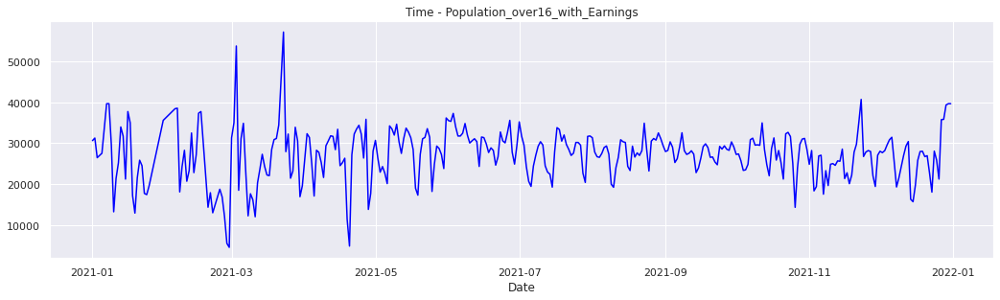

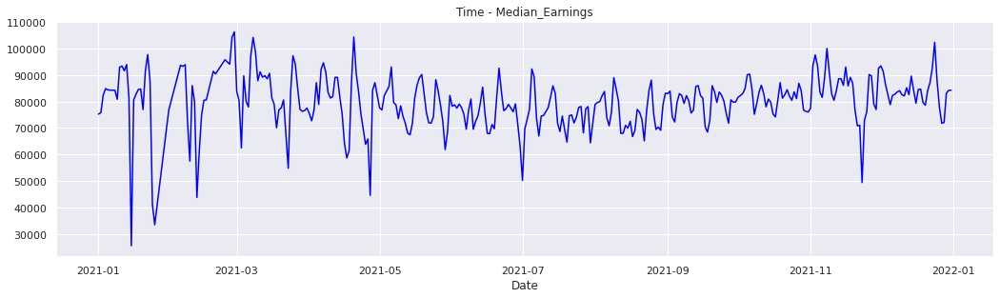

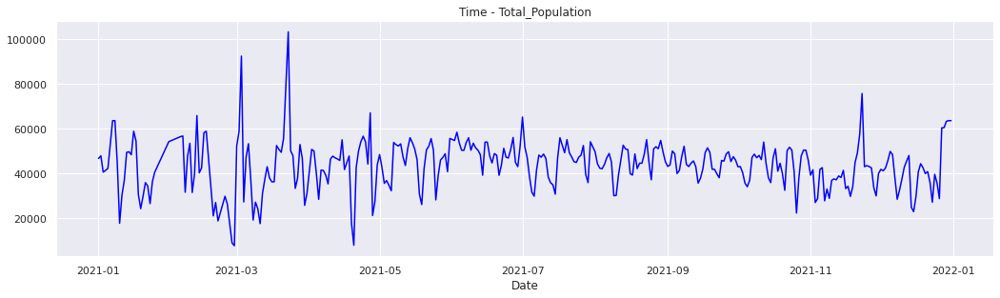

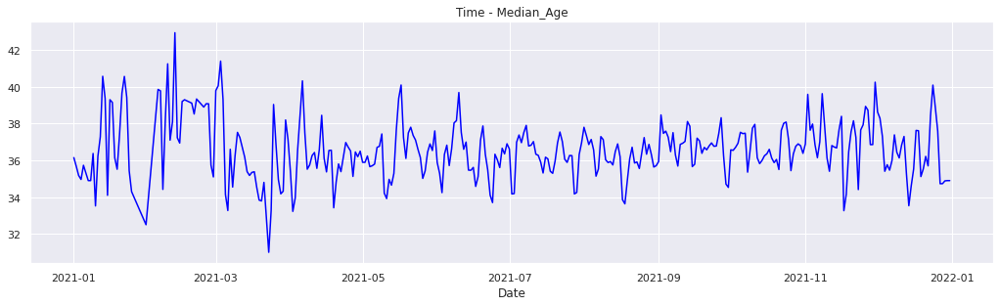

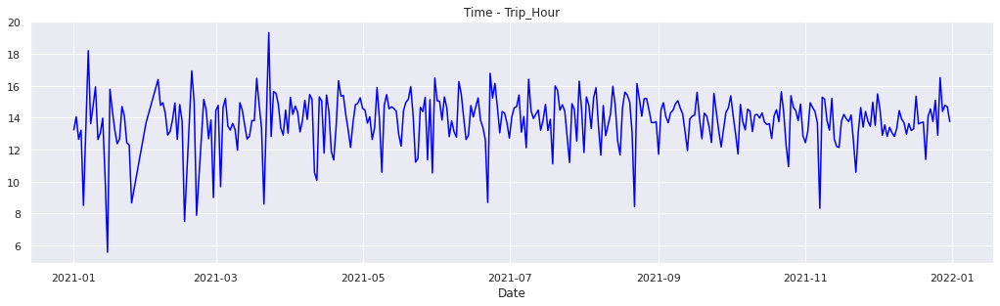

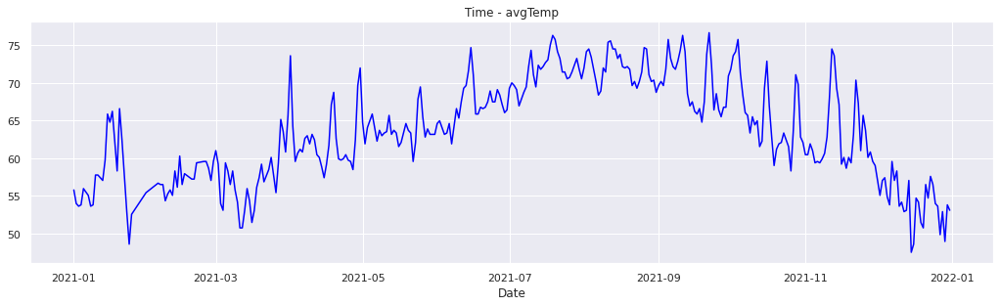

In [ ]:
plt.figure(figsize = (60,10))
plt.subplot(231)
plt.title('Time - Population_over16_with_Earnings')
plt.xlabel('Date')
race_white_line = plt.plot(ts_ot.date,ts_ot.population_over16_with_earnings, label = 'population_over16_with_earnings', color = 'blue')

plt.figure(figsize = (60,10))
plt.subplot(232)
plt.title('Time - Median_Earnings')
plt.xlabel('Date')
race_black_line = plt.plot(ts_ot.date,ts_ot.median_earnings, label = 'median_earnings', color = 'blue')

plt.figure(figsize = (60,10))
plt.subplot(233)
plt.title('Time - Total_Population')
plt.xlabel('Date')
race_ai_line = plt.plot(ts_ot.date,ts_ot.total_population, label = 'total_population', color = 'blue')

plt.figure(figsize = (60,10))
plt.subplot(234)
plt.title('Time - Median_Age')
plt.xlabel('Date')
race_asian_line = plt.plot(ts_ot.date,ts_ot.median_age, label = 'median_age', color = 'blue')

plt.figure(figsize = (60,10))
plt.subplot(235)
plt.title('Time - Trip_Hour')
plt.xlabel('Date')
FHV_ata_line = plt.plot(ts_ot.date,ts_ot.Trip_Hour, label = 'Trip_Hour', color = 'blue')

plt.figure(figsize = (60,10))
plt.subplot(236)
plt.title('Time - avgTemp')
plt.xlabel('Date')
yellow_data_line = plt.plot(ts_ot.date,ts_ot.avgTemp, label = 'avgTemp', color = 'blue')
plt.show()

## sesonal decompose

### numbers

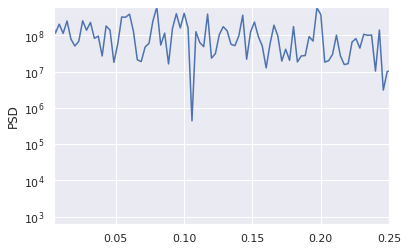

Strongest period length = 12.5


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.population_over16_with_earnings)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

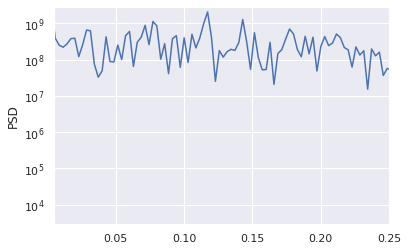

Strongest period length = 8.536585365853659


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.median_earnings)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

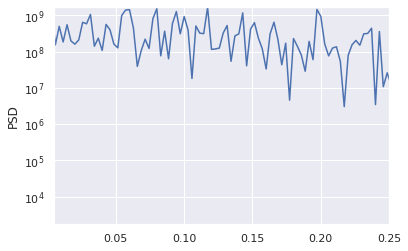

Strongest period length = 8.536585365853659


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.total_population)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

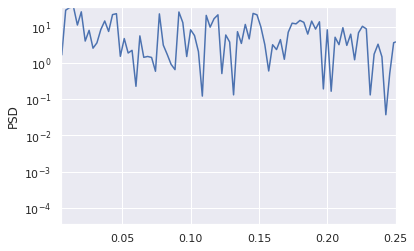

Strongest period length = 70.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.median_age)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

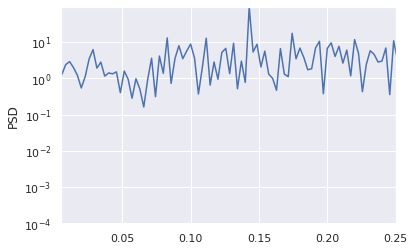

Strongest period length = 7.0


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.Trip_Hour)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

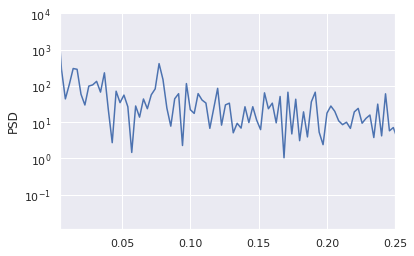

Strongest period length = 12.962962962962964


In [ ]:
f, PSD = scipy.signal.periodogram(ts_ot.avgTemp)
plt.semilogy(f, PSD)
plt.ylabel('PSD')
plt.xlim(0.005,0.25) #show frequencies within 1/4..1/200, periods of 4-200 weeks
plt.ylim(max(PSD)/1e6,max(PSD)) #show strength up to 1e-6 of the max

#filter outputs - periods shorter than 2 years (approx 100 weeks) 
PSD = PSD[f>0.01]
f = f[f>0.01] 
plt.show()
print('Strongest period length = {}'.format(1/f[np.argmax(PSD)])) #report the length of the strongest period

#transformting the frequency into the period length, using 1=frequency (number of periods)*period length

### all_sesonal_pop/temp/..

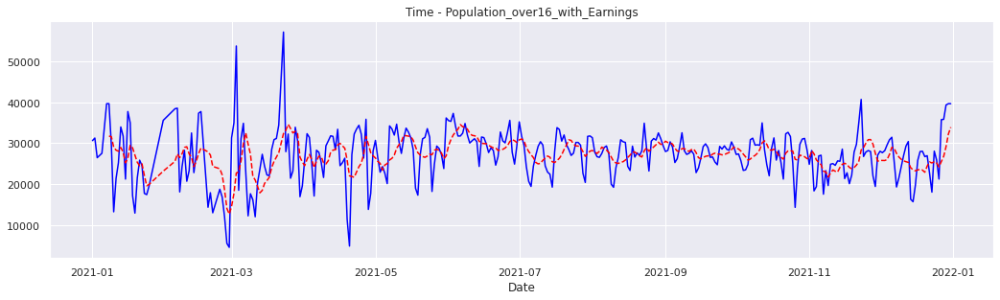

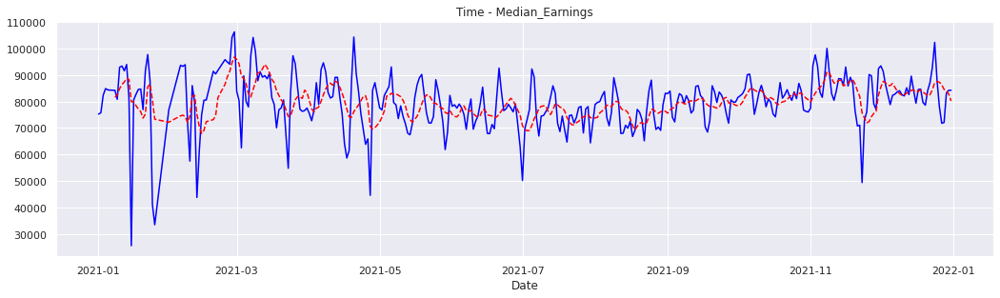

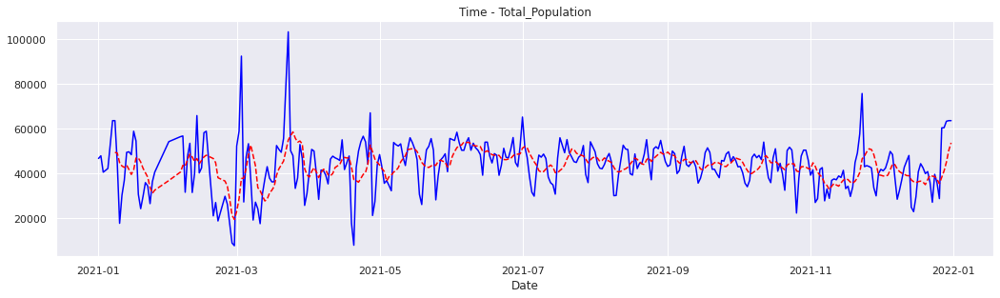

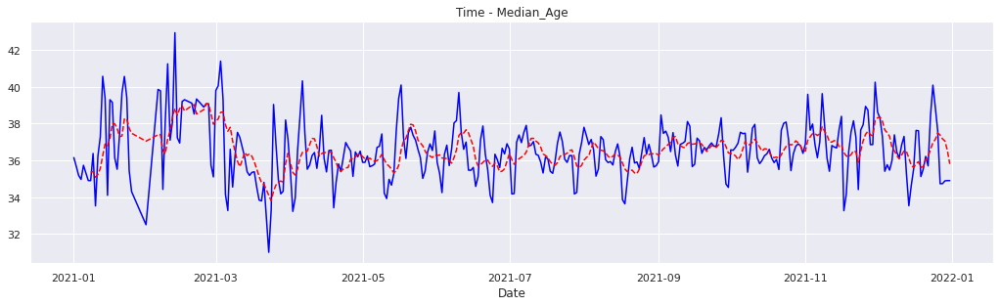

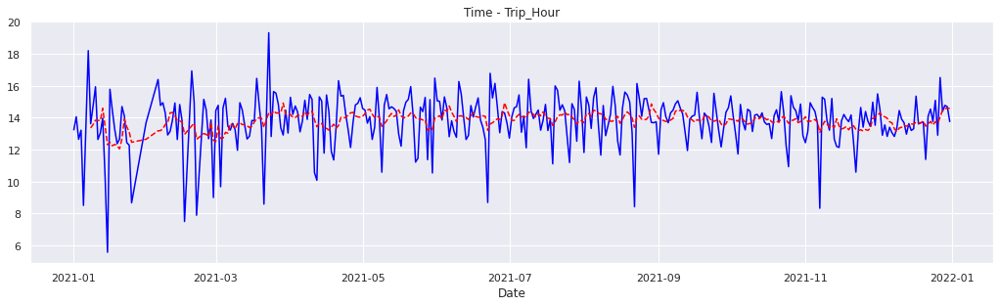

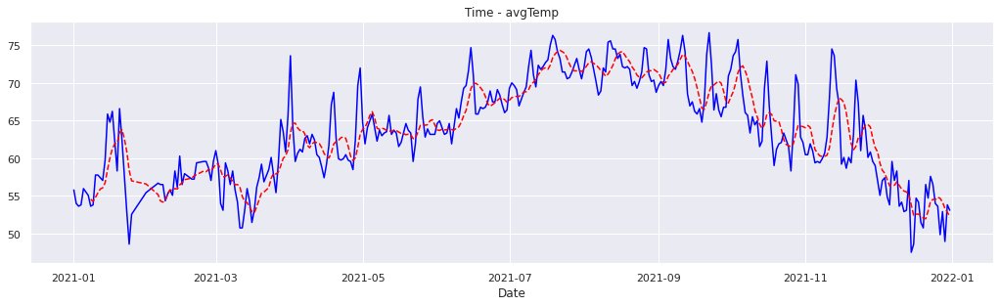

In [ ]:
plt.figure(figsize = (60,10))
plt.subplot(231)
plt.title('Time - Population_over16_with_Earnings')
plt.xlabel('Date')
race_white_line = plt.plot(ts_ot.date,ts_ot.population_over16_with_earnings, label = 'population_over16_with_earnings', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.population_over16_with_earnings.rolling(window = 7).mean(), label='population_over16_with_earnings Mean', linestyle='--',color='red')

plt.figure(figsize = (60,10))
plt.subplot(232)
plt.title('Time - Median_Earnings')
plt.xlabel('Date')
race_black_line = plt.plot(ts_ot.date,ts_ot.median_earnings, label = 'median_earnings', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.median_earnings.rolling(window = 7).mean(), label='median_earnings Mean', linestyle='--',color='red')

plt.figure(figsize = (60,10))
plt.subplot(233)
plt.title('Time - Total_Population')
plt.xlabel('Date')
race_ai_line = plt.plot(ts_ot.date,ts_ot.total_population, label = 'total_population', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.total_population.rolling(window = 7).mean(), label='total_population Mean', linestyle='--',color='red')

plt.figure(figsize = (60,10))
plt.subplot(234)
plt.title('Time - Median_Age')
plt.xlabel('Date')
race_asian_line = plt.plot(ts_ot.date,ts_ot.median_age, label = 'median_age', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.median_age.rolling(window = 7).mean(), label='median_age Mean', linestyle='--',color='red')

plt.figure(figsize = (60,10))
plt.subplot(235)
plt.title('Time - Trip_Hour')
plt.xlabel('Date')
FHV_ata_line = plt.plot(ts_ot.date,ts_ot.Trip_Hour, label = 'Trip_Hour', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.Trip_Hour.rolling(window = 7).mean(), label='Trip_Hour Mean', linestyle='--',color='red')

plt.figure(figsize = (60,10))
plt.subplot(236)
plt.title('Time - avgTemp')
plt.xlabel('Date')
yellow_data_line = plt.plot(ts_ot.date,ts_ot.avgTemp, label = 'avgTemp', color = 'blue')
FHV_mean_line = plt.plot(ts_ot.date,ts_ot.avgTemp.rolling(window = 7).mean(), label='avgTemp Mean', linestyle='--',color='red')

plt.show()